# Diptera wing classification using Topological Data Analysis

Guilherme Vituri F. Pinto [](https://orcid.org/0000-0002-7813-8777) (Universidade Estadual Paulista)  
Sergio UraNorthonFebruary 25, 2026

We apply tools from Topological Data Analysis (TDA) to classify Diptera families based on wing venation patterns. Using two complementary filtration strategies — Vietoris-Rips on point clouds and radial filtrations on wing images — we extract both H0 and H1 topological features via extended summary statistics and compare classifiers via leave-one-out cross-validation. We focus on interpretable models (LDA, Decision Trees) to identify explainable topological criteria that distinguish families.

In [1]:
using TDAfly, TDAfly.Preprocessing, TDAfly.TDA, TDAfly.Analysis
using Images: mosaicview, Gray
using Plots: plot, display, heatmap, scatter, bar
using StatsPlots: boxplot
using PersistenceDiagrams
using PersistenceDiagrams: BettiCurve, Landscape, PersistenceImage
using DataFrames
using Distances: euclidean
using LIBSVM
using StatsBase: mean

## 1 Introduction

The order Diptera (true flies) comprises over 150,000 described species across more than 150 families. Wing venation patterns are a classical diagnostic character in Diptera systematics: the arrangement, branching and connectivity of veins varies markedly across families and provides a natural morphological signature.

In this work, we apply **Topological Data Analysis (TDA)** to the problem of classifying Diptera families from wing images. TDA provides a framework for extracting shape descriptors that are robust to continuous deformations — exactly the kind of invariance desirable when comparing biological structures that vary in scale, orientation and minor deformations across individuals.

We employ two complementary filtration strategies:

1.  **Vietoris-Rips filtration** on point-cloud samples of wing silhouettes — captures global loop structure
2.  **Radial filtration** from the wing centroid to the periphery — captures how vein topology is organized from center outward

For each filtration, we compute both **H0** (connected components / vein branching) and **H1** (loops / enclosed cells) persistence, then extract extended summary statistics (19 interpretable features per diagram) and classify using simple, explainable models (LDA, Decision Trees, Random Forests). The goal is to find interpretable topological criteria for family identification.

> **Why only two filtrations?**
>
> We initially tested five filtration strategies including directional height filtrations (8 directions), Euclidean Distance Transform (EDT), and grayscale cubical filtrations. However: **(a)** directional filtrations are noise-sensitive — in images with isolated pixels and incomplete vein segmentation, each sweep direction creates spurious topological features; **(b)** EDT produces trivial persistence on binarized images where veins are ~1 pixel wide; **(c)** cubical (grayscale) filtrations are meaningless on already-binarized black-and-white images. See `NOTES.md` for details on discarded methods.

## 2 Methods

### 2.1 Data loading and preprocessing

All images are in the `images/processed` directory. For each image, we load it, apply a Gaussian blur (to close small gaps in the wing membrane and keep it connected), crop to the bounding box, and resize to 150 pixels of height.

In [2]:
all_paths = readdir("images/processed", join = true)
all_filenames = basename.(all_paths) .|> (x -> replace(x, ".png" => ""))

function extract_family(name)
    family_raw = lowercase(split(name, r"[\s\-]")[1])
    if family_raw in ("bibionidae", "biobionidae")
        return "Bibionidae"
    elseif family_raw in ("sciaridae", "scaridae")
        return "Sciaridae"
    elseif family_raw == "simulidae"
        return "Simuliidae"
    else
        return titlecase(family_raw)
    end
end

function canonical_id(name)
    family = extract_family(name)
    parts = split(name, r"[\s\-]")
    number = parts[end]
    "$(family)-$(number)"
end

# Deduplicate (space vs hyphen variants of the same file)
seen = Set{String}()
keep_idx = Int[]
for (i, fname) in enumerate(all_filenames)
    cid = canonical_id(fname)
    if !(cid in seen)
        push!(seen, cid)
        push!(keep_idx, i)
    end
end

paths = all_paths[keep_idx]
species = all_filenames[keep_idx]
families = extract_family.(species)

individuals = map(species) do specie
    parts = split(specie, r"[\s\-]")
    string(extract_family(specie)[1]) * "-" * parts[end]
end

println("Total images after deduplication: $(length(paths))")
println("Families: ", sort(unique(families)))
println("\nSamples per family:")
for f in sort(unique(families))
    println("  $(f): $(count(==(f), families))")
end

Total images after deduplication: 70
Families: ["Asilidae", "Bibionidae", "Ceratopogonidae", "Chironomidae", "Rhagionidae", "Sciaridae", "Simuliidae", "Tabanidae", "Tipulidae"]

Samples per family:
  Asilidae: 8
  Bibionidae: 6
  Ceratopogonidae: 8
  Chironomidae: 8
  Rhagionidae: 4
  Sciaridae: 6
  Simuliidae: 7
  Tabanidae: 11
  Tipulidae: 12

#### 2.1.1 Excluding small families

Families with fewer than 3 samples (e.g. Pelecorhynchidae with $n=2$) can distort cross-validation results—a single misclassification changes accuracy by 50%. We provide a filtered version and run the analysis both ways.

In [3]:
MIN_FAMILY_SIZE = 3
family_counts = Dict(f => count(==(f), families) for f in unique(families))
small_families = [f for (f, c) in family_counts if c < MIN_FAMILY_SIZE]

if !isempty(small_families)
    println("Families with < $MIN_FAMILY_SIZE samples (excluded from filtered analysis):")
    for f in sort(small_families)
        println("  $(f): $(family_counts[f]) samples")
    end
end

# Build filtered indices
keep_filtered = [i for i in eachindex(families) if family_counts[families[i]] >= MIN_FAMILY_SIZE]
paths_filtered = paths[keep_filtered]
species_filtered = species[keep_filtered]
families_filtered = families[keep_filtered]
individuals_filtered = individuals[keep_filtered]

println("\nFiltered dataset: $(length(keep_filtered)) samples, $(length(unique(families_filtered))) families")


Filtered dataset: 70 samples, 9 families

In [4]:
wings = load_wing.(paths, blur = 1.8)
Xs = map(wings) do w
    image_to_r2(w; threshold=0.08, ensure_connected = true, connectivity = 8)
end;


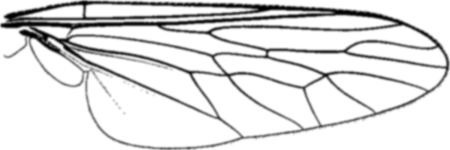

In [5]:
wings[1]

In [6]:
scatter(Xs[5] .|> first, Xs[5] .|> last)

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip070)" d="M229.071 1834 Q225.46 1834 223.631 1837.57 Q221.825 1841.11 221.825 1848.24 Q221.825 1855.34 223.631 1858.91 Q225.46 1862.45 229.071 1862.45 Q232.705 1862.45 234.51 1858.91 Q236.339 1855.34 236.339 1848.24 Q236.339 1841.11 234.51 1837.57 Q232.705 1834 229.071 1834 M229.071 1830.3 Q234.881 1830.3 237.936 1834.9 Q241.015 1839.49 241.015 1848.24 Q241.015 1856.96 237.936 1861.57 Q234.881 1866.15 229.071 1866.15 Q223.261 1866.15 220.182 1861.57 Q217.126 1856.96 217.126 1848.24 Q217.126 1839.49 220.182 1834.9 Q223.261 1830.3 229.071 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip070)" d="M984.402 1830.92 L1002.76 1830.92 L1002.76 1834.86 L988.685 1834.86 L988.685 1843.33 Q989.703 1842.98 990.722 1842.82 Q991.74 1842.64 992.759 1842.64 Q998.546 1842.64 1001.93 1845.81 Q1005.3 1848.98 1005.3 1854.4 Q1005.3 1859.97 1001.83 1863.08 Q998.36 1866.15 992.041 1866.15 Q989.865 1866.15 987.597 1865.78 Q985.351 1865.41 982.944 1864.67 L982.944 1859.97 Q985.027 1861.11 987.249 1861.66 Q989.472 1862.22 991.948 1862.22 Q995.953 1862.22 998.291 1860.11 Q1000.63 1858.01 1000.63 1854.4 Q1000.63 1850.78 998.291 1848.68 Q995.953 1846.57 991.948 1846.57 Q990.073 1846.57 988.198 1846.99 Q986.347 1847.4 984.402 1848.28 L984.402 1830.92 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip070)" d="M1024.52 1834 Q1020.91 1834 1019.08 1837.57 Q1017.27 1841.11 1017.27 1848.24 Q1017.27 1855.34 1019.08 1858.91 Q1020.91 1862.45 1024.52 1862.45 Q1028.15 1862.45 1029.96 1858.91 Q1031.79 1855.34 1031.79 1848.24 Q1031.79 1841.11 1029.96 1837.57 Q1028.15 1834 1024.52 1834 M1024.52 1830.3 Q1030.33 1830.3 1033.38 1834.9 Q1036.46 1839.49 1036.46 1848.24 Q1036.46 1856.96 1033.38 1861.57 Q1030.33 1866.15 1024.52 1866.15 Q1018.71 1866.15 1015.63 1861.57 Q1012.57 1856.96 1012.57 1848.24 Q1012.57 1839.49 1015.63 1834.9 Q1018.71 1830.3 1024.52 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip070)" d="M1789.29 1834 Q1785.68 1834 1783.85 1837.57 Q1782.05 1841.11 1782.05 1848.24 Q1782.05 1855.34 1783.85 1858.91 Q1785.68 1862.45 1789.29 1862.45 Q1792.93 1862.45 1794.73 1858.91 Q1796.56 1855.34 1796.56 1848.24 Q1796.56 1841.11 1794.73 1837.57 Q1792.93 1834 1789.29 1834 M1789.29 1830.3 Q1795.1 1830.3 1798.16 1834.9 Q1801.24 1839.49 1801.24 1848.24 Q1801.24 1856.96 1798.16 1861.57 Q1795.1 1866.15 1789.29 1866.15 Q1783.48 1866.15 1780.4 1861.57 Q1777.35 1856.96 1777.35 1848.24 Q1777.35 1839.49 1780.4 1834.9 Q1783.48 1830.3 1789.29 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip070)" d="M1819.46 1834 Q1815.84 1834 1814.02 1837.57 Q1812.21 1841.11 1812.21 1848.24 Q1812.21 1855.34 1814.02 1858.91 Q1815.84 1862.45 1819.46 1862.45 Q1823.09 1862.45 1824.9 1858.91 Q1826.72 1855.34 1826.72 1848.24 Q1826.72 1841.11 1824.9 1837.57 Q1823.09 1834 1819.46 1834 M1819.46 1830.3 Q1825.27 1830.3 1828.32 1834.9 Q1831.4 1839.49 1831.4 1848.24 Q1831.4 1856.96 1828.32 1861.57 Q1825.27 1866.15 1819.46 1866.15 Q1813.65 1866.15 1810.57 1861.57 Q1807.51 1856.96 1807.51 1848.24 Q1807.51 1839.49 1810.57 1834.9 Q1813.65 1830.3 1819.46 1830.3 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip070)" d="M2559.97 1830.92 L2578.33 1830.92 L2578.33 1834.86 L2564.25 1834.86 L2564.25 1843.33 Q2565.27 1842.98 2566.29 1842.82 Q2567.31 1842.64 2568.33 1842.64 Q2574.12 1842.64 2577.5 1845.81 Q2580.87 1848.98 2580.87 1854.4 Q2580.87 1859.97 2577.4 1863.08 Q2573.93 1866.15 2567.61 1866.15 Q2565.44 1866.15 2563.17 1865.78 Q2560.92 1865.41 2558.51 1864.67 L2558.51 1859.97 Q2560.6 1861.11 2562.82 1861.66 Q2565.04 1862.22 2567.52 1862.22 Q2571.52 1862.22 2573.86 1860.11 Q2576.2 1858.01 2576.2 1854.4 Q2576.2 1850.78 2573.86 1848.68 Q2571.52 1846.57 2567.52 1846.57 Q2565.64 1846.57 2563.77 1846.99 Q2561.92 1847.4 255


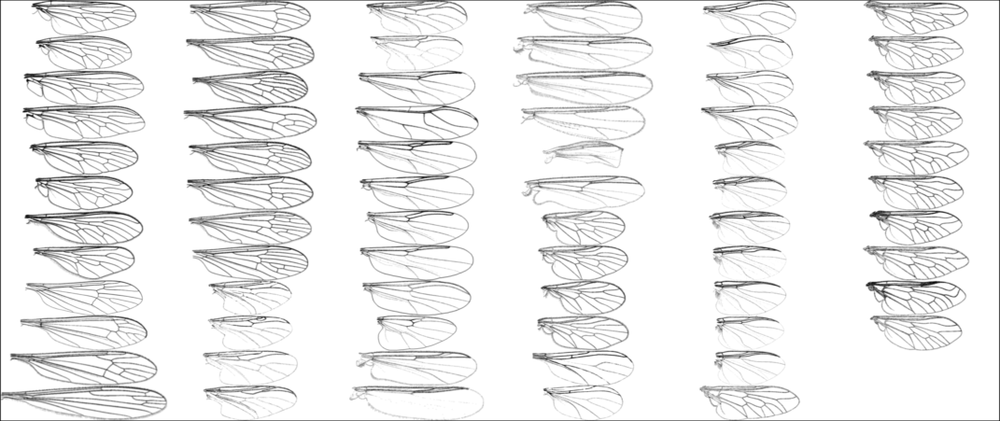

In [7]:
mosaicview(wings, ncol = 6, fillvalue = 1)

### 2.2 Example: forcing connectivity on 5 wings

The chunk below selects 5 wings (prioritizing those with the largest number of disconnected components before correction), then compares the binary pixel set before and after `connect_pixel_components`.

In [8]:
threshold_conn = 0.1
conn = 8

component_count_before = map(wings) do w
    ids0 = findall_ids(>(threshold_conn), image_to_array(w))
    length(pixel_components(ids0; connectivity = conn))
end

demo_idx = sortperm(component_count_before, rev = true)[1:min(5, length(wings))]

function ids_to_mask(ids)
    isempty(ids) && return zeros(Float32, 1, 1)
    xs = first.(ids)
    ys = last.(ids)
    M = zeros(Float32, maximum(xs), maximum(ys))
    for p in ids
        M[p[1], p[2]] = 1f0
    end
    M
end

demo_connectivity_df = DataFrame(
    sample = String[],
    n_components_before = Int[],
    n_components_after = Int[],
    n_pixels_before = Int[],
    n_pixels_after = Int[],
)

panel_plots = Any[]
for idx in demo_idx
    ids_before = findall_ids(>(threshold_conn), image_to_array(wings[idx]))
    ids_after = connect_pixel_components(ids_before; connectivity = conn)

    n_before = length(pixel_components(ids_before; connectivity = conn))
    n_after = length(pixel_components(ids_after; connectivity = conn))

    push!(demo_connectivity_df, (
        species[idx],
        n_before,
        n_after,
        length(ids_before),
        length(ids_after),
    ))

    M_before = ids_to_mask(ids_before)
    M_after = ids_to_mask(ids_after)

    p_before = heatmap(
        M_before[end:-1:1, :],
        color = :grays,
        colorbar = false,
        legend = false,
        aspect_ratio = :equal,
        xticks = false,
        yticks = false,
        title = "Before: $(species[idx])\ncomponents = $(n_before)",
    )

    p_after = heatmap(
        M_after[end:-1:1, :],
        color = :grays,
        colorbar = false,
        legend = false,
        aspect_ratio = :equal,
        xticks = false,
        yticks = false,
        title = "After: $(species[idx])\ncomponents = $(n_after)",
    )

    push!(panel_plots, p_before)
    push!(panel_plots, p_after)
end

plot(panel_plots..., layout = (length(demo_idx), 2), size = (900, 260 * length(demo_idx)))

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip190)" d="M486.889 64.8611 L486.889 87.0195 L500.014 87.0195 Q506.617 87.0195 509.776 84.3054 Q512.977 81.5508 512.977 75.92 Q512.977 70.2488 509.776 67.5752 Q506.617 64.8611 500.014 64.8611 L486.889 64.8611 M486.889 39.9885 L486.889 58.2176 L499.001 58.2176 Q504.996 58.2176 507.913 55.9896 Q510.87 53.7211 510.87 49.103 Q510.87 44.5255 507.913 42.257 Q504.996 39.9885 499.001 39.9885 L486.889 39.9885 M478.706 33.264 L499.609 33.264 Q508.966 33.264 514.03 37.1529 Q519.093 41.0417 519.093 48.2118 Q519.093 53.7616 516.501 57.0428 Q513.908 60.324 508.885 61.1342 Q514.921 62.4305 518.243 66.5624 Q521.605 70.6538 521.605 76.8112 Q521.605 84.913 516.096 89.3285 Q510.587 93.744 500.419 93.744 L478.706 93.744 L478.706 33.264 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip190)" d="M574.105 69.1955 L574.105 72.8413 L539.834 72.8413 Q540.32 80.5381 544.452 84.589 Q548.625 88.5994 556.038 88.5994 Q560.332 88.5994 564.342 87.5461 Q568.393 86.4929 572.363 84.3864 L572.363 91.435 Q568.352 93.1364 564.14 94.0276 Q559.927 94.9188 555.592 94.9188 Q544.736 94.9188 538.376 88.5994 Q532.056 82.2799 532.056 71.5045 Q532.056 60.3645 538.052 53.8426 Q544.088 47.2801 554.296 47.2801 Q563.451 47.2801 568.758 53.1944 Q574.105 59.0683 574.105 69.1955 M566.651 67.008 Q566.57 60.8912 563.208 57.2454 Q559.886 53.5995 554.377 53.5995 Q548.138 53.5995 544.371 57.1238 Q540.644 60.6481 540.077 67.0485 L566.651 67.008 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip190)" d="M633.126 53.5995 Q627.131 53.5995 623.647 58.2986 Q620.164 62.9571 620.164 71.0994 Q620.164 79.2418 623.607 83.9408 Q627.091 88.5994 633.126 88.5994 Q639.081 88.5994 642.565 83.9003 Q646.049 79.2013 646.049 71.0994 Q646.049 63.0381 642.565 58.3391 Q639.081 53.5995 633.126 53.5995 M633.126 47.2801 Q642.849 47.2801 648.398 53.5995 Q653.948 59.9189 653.948 71.0994 Q653.948 82.2394 648.398 88.5994 Q642.849 94.9188 633.126 94.9188 Q623.364 94.9188 617.814 88.5994 Q612.305 82.2394 612.305 71.0994 Q612.305 59.9189 617.814 53.5995 Q623.364 47.2801 633.126 47.2801 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip190)" d="M737.397 69.1955 L737.397 72.8413 L703.126 72.8413 Q703.612 80.5381 707.744 84.589 Q711.917 88.5994 719.33 88.5994 Q723.624 88.5994 727.634 87.5461 Q731.685 86.4929 735.655 84.3864 L735.655 91.435 Q731.644 93.1364 727.431 94.0276 Q723.219 94.9188 718.884 94.9188 Q708.028 94.9188 701.668 88.5994 Q695.348 82.2799 695.348 71.5045 Q695.348 60.3645 701.344 53.8426 Q707.38 47.2801 717.588 47.2801 Q726.743 47.2801 732.05 53.1944 Q737.397 59.0683 737.397 69.1955 M729.943 67.008 Q729.862 60.8912 726.5 57.2454 Q723.178 53.5995 717.669 53.5995 Q711.43 53.5995 707.663 57.1238 Q703.936 60.6481 703.369 67.0485 L729.943 67.008 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip190)" d="M832.877 49.7107 L832.877 56.7592 Q829.717 55.1389 826.314 54.3287 Q822.911 53.5185 819.265 53.5185 Q813.716 53.5185 810.921 55.2199 Q808.166 56.9213 808.166 60.324 Q808.166 62.9166 810.151 64.4155 Q812.136 65.8738 818.131 67.2106 L820.683 67.7777 Q828.623 69.4791 831.945 72.5983 Q835.307 75.677 835.307 81.2267 Q835.307 87.5461 830.284 91.2324 Q825.301 94.9188 816.551 94.9188 Q812.906 94.9188 808.936 94.1896 Q805.006 93.5009 800.631 92.0831 L800.631 84.3864 Q804.763 86.5334 808.774 87.6271 Q812.784 88.6804 816.713 88.6804 Q821.98 88.6804 824.815 86.898 Q827.651 85.0751 827.651 81.7938 Q827.651 78.7557 825.585 77.1353 Q823.559 75.5149 816.632 74.0161 L814.04 73.4085 Q807.113 71.9501 804.034 68.9525 Q800.955 65.9143 800.955 60.6481 Q800.955 54.2477 805.492 50.7639 Q810.029 47.2801 818.374 47.2801 Q822.506 47.2801 826.152 47.8878 Q829.798 48.4954 832.877 49.7107 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip190)" d="M905.55 57.0833 Q908.345 52.06

In [9]:
demo_connectivity_df

## 3 Topological feature extraction

We compute persistent homology using two filtration strategies. For the Vietoris-Rips filtration on connected point clouds, H0 is uninformative (single infinite bar), so we use only H1. For the radial filtration (computed via sublevel-set persistence on the pixel grid), **H0 is highly informative** — it captures when disconnected vein segments merge as the filtration parameter grows, directly encoding vein count and branching patterns. We therefore compute both H0 and H1 for the radial filtration.

> **What is persistent homology?**
>
> Persistent homology is the main tool of TDA. Given a shape or dataset, it tracks how topological features — connected components (dimension 0), loops (dimension 1), voids (dimension 2), etc. — appear and disappear as we “grow” the shape through a filtration parameter. Each feature has a **birth** time (when it appears) and a **death** time (when it gets filled in). The collection of all (birth, death) pairs is called a **persistence diagram**. Features with long lifetimes (high persistence = death $-$ birth) represent genuine topological structure, while short-lived features are typically noise.

### 3.1 Strategy 1: Vietoris-Rips filtration on point clouds

> **Vietoris-Rips filtration**
>
> Given a set of points in $\mathbb{R}^n$, the Vietoris-Rips complex at scale $\varepsilon$ connects any subset of points that are pairwise within distance $\varepsilon$. As $\varepsilon$ increases from 0, we obtain a nested sequence of simplicial complexes — the Rips filtration. This is the most common filtration in TDA for point-cloud data. It is computationally expensive (since it must consider all pairwise distances), which is why we subsample the point clouds.

We sample 750 points from each wing silhouette using farthest-point sampling (which ensures good coverage of the shape), then compute 1-dimensional Rips persistence:

In [10]:
samples = Vector{Any}(undef, length(Xs))
Threads.@threads for i in eachindex(Xs)
    samples[i] = farthest_points_sample(Xs[i], 750)
end

In [11]:
pds_rips = @showprogress map(samples) do s
    rips_pd_1d(s, cutoff = 5, threshold = 200)
end;

In [12]:
wing_arrays = [convert(Array{Float64}, w) for w in wings]

70-element Vector{Matrix{Float64}}:
 [1.0000000074505813 1.0000000074505813 … 1.0000000074505813 1.0000000074505813; 1.0000000074505813 1.0000000074505813 … 1.0000000074505813 1.0000000074505813; … ; 1.0000000074505813 1.0000000074505813 … 1.0000000074505813 1.0000000074505813; 1.0000000074505813 1.0000000074505813 … 1.0000000074505813 1.0000000074505813]
 [1.0000000074505813 1.0000000074505813 … 1.0000000074505813 1.0000000074505813; 1.0000000074505813 1.0000000074505813 … 1.0000000074505813 1.0000000074505813; … ; 1.0000000074505813 1.0000000074505813 … 1.0000000074505813 1.0000000074505813; 1.0000000074505813 1.0000000074505813 … 1.0000000074505813 1.0000000074505813]
 [1.0000000074505813 1.0000000074505813 … 1.0000000074505813 1.0000000074505813; 1.0000000074505813 1.0000000074505813 … 1.0000000074505813 1.0000000074505813; … ; 1.0000000074505813 1.0000000074505813 … 1.0000000074505813 1.0000000074505813; 1.0000000074505813 1.0000000074505813 … 1.0000000074505813 1.0000000074505813

### 3.2 Strategy 2: Radial filtration

> **Radial filtration**
>
> The **radial filtration** assigns each foreground pixel a value equal to its distance from the centroid of the wing. Sublevel-set persistence on this function captures how topological features (loops in the venation) are distributed from the center of the wing outward. This is complementary to the Rips filtration, which captures global loop structure without spatial information.

In [13]:
pds_radial = @showprogress "radial_pd_1d" map(wing_arrays) do A
    radial_pd_1d(A)
end;

We also compute H0 persistence for the radial filtration, capturing how disconnected vein segments merge as the radial sweep grows outward:

In [14]:
pds_radial_h0 = @showprogress "radial_pd_0d" map(wing_arrays) do A
    radial_pd_0d(A)
end;

### 3.3 Visualizing the radial filtration

The radial filtration assigns each foreground pixel a value proportional to its distance from the wing centroid. Below we visualize the radial filtration arrays and the resulting persistence diagrams for one wing per family:

In [15]:
example_indices = [findfirst(==(f), families) for f in sort(unique(families))]

for i in example_indices[1:min(5, length(example_indices))]
    F_rad = radial_filtration(wing_arrays[i])

    # Only show foreground in the heatmap
    F_display = copy(F_rad)
    F_display[F_display .> 1.5] .= NaN  # mask background

    p1 = heatmap(F_display[end:-1:1, :],
                 color = :viridis, colorbar = true,
                 title = "Radial filtration",
                 aspect_ratio = :equal, xticks = false, yticks = false)

    p2 = heatmap(wing_arrays[i][end:-1:1, :],
                 color = :grays, colorbar = false,
                 title = "Wing image",
                 aspect_ratio = :equal, xticks = false, yticks = false)

    pers_rad_h1 = persistence.(pds_radial[i])
    p3 = isempty(pers_rad_h1) ? plot(title = "Radial H₁ (empty)") :
         bar(sort(pers_rad_h1, rev = true), title = "Radial H₁ (loops)",
             legend = false, ylabel = "persistence")

    pers_rad_h0 = [persistence(x) for x in pds_radial_h0[i] if isfinite(persistence(x))]
    p4 = isempty(pers_rad_h0) ? plot(title = "Radial H₀ (empty)") :
         bar(sort(pers_rad_h0, rev = true), title = "Radial H₀ (components)",
             legend = false, ylabel = "persistence")

    p = plot(p1, p2, p3, p4, layout = (2, 2), size = (900, 700),
             plot_title = "$(families[i]) — $(individuals[i])")
    display(p)
end;

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip310)" d="M557.76 184.22 Q560.393 185.111 562.864 188.028 Q565.375 190.944 567.887 196.048 L576.191 212.576 L567.401 212.576 L559.664 197.061 Q556.666 190.985 553.83 189 Q551.035 187.015 546.174 187.015 L537.262 187.015 L537.262 212.576 L529.079 212.576 L529.079 152.096 L547.551 152.096 Q557.922 152.096 563.026 156.43 Q568.13 160.765 568.13 169.515 Q568.13 175.227 565.456 178.994 Q562.823 182.761 557.76 184.22 M537.262 158.821 L537.262 180.29 L547.551 180.29 Q553.466 180.29 556.463 177.576 Q559.502 174.822 559.502 169.515 Q559.502 164.208 556.463 161.535 Q553.466 158.821 547.551 158.821 L537.262 158.821 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip310)" d="M605.196 189.769 Q596.162 189.769 592.679 191.835 Q589.195 193.901 589.195 198.884 Q589.195 202.854 591.787 205.203 Q594.42 207.512 598.917 207.512 Q605.115 207.512 608.842 203.137 Q612.609 198.722 612.609 191.43 L612.609 189.769 L605.196 189.769 M620.063 186.691 L620.063 212.576 L612.609 212.576 L612.609 205.689 Q610.057 209.821 606.249 211.806 Q602.441 213.751 596.932 213.751 Q589.964 213.751 585.833 209.862 Q581.741 205.933 581.741 199.37 Q581.741 191.714 586.845 187.825 Q591.99 183.936 602.158 183.936 L612.609 183.936 L612.609 183.207 Q612.609 178.062 609.206 175.267 Q605.844 172.432 599.727 172.432 Q595.838 172.432 592.152 173.363 Q588.466 174.295 585.063 176.158 L585.063 169.272 Q589.154 167.692 593.003 166.922 Q596.851 166.112 600.497 166.112 Q610.34 166.112 615.202 171.216 Q620.063 176.32 620.063 186.691 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip310)" d="M665.271 174.092 L665.271 149.544 L672.724 149.544 L672.724 212.576 L665.271 212.576 L665.271 205.77 Q662.921 209.821 659.316 211.806 Q655.751 213.751 650.728 213.751 Q642.505 213.751 637.319 207.188 Q632.175 200.626 632.175 189.931 Q632.175 179.237 637.319 172.675 Q642.505 166.112 650.728 166.112 Q655.751 166.112 659.316 168.097 Q662.921 170.042 665.271 174.092 M639.872 189.931 Q639.872 198.155 643.234 202.854 Q646.637 207.512 652.551 207.512 Q658.465 207.512 661.868 202.854 Q665.271 198.155 665.271 189.931 Q665.271 181.708 661.868 177.05 Q658.465 172.351 652.551 172.351 Q646.637 172.351 643.234 177.05 Q639.872 181.708 639.872 189.931 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip310)" d="M731.746 189.769 Q722.713 189.769 719.229 191.835 Q715.745 193.901 715.745 198.884 Q715.745 202.854 718.338 205.203 Q720.971 207.512 725.467 207.512 Q731.665 207.512 735.392 203.137 Q739.159 198.722 739.159 191.43 L739.159 189.769 L731.746 189.769 M746.613 186.691 L746.613 212.576 L739.159 212.576 L739.159 205.689 Q736.607 209.821 732.799 211.806 Q728.991 213.751 723.482 213.751 Q716.515 213.751 712.383 209.862 Q708.291 205.933 708.291 199.37 Q708.291 191.714 713.395 187.825 Q718.54 183.936 728.708 183.936 L739.159 183.936 L739.159 183.207 Q739.159 178.062 735.756 175.267 Q732.394 172.432 726.277 172.432 Q722.388 172.432 718.702 173.363 Q715.016 174.295 711.613 176.158 L711.613 169.272 Q715.704 167.692 719.553 166.922 Q723.401 166.112 727.047 166.112 Q736.891 166.112 741.752 171.216 Q746.613 176.32 746.613 186.691 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip310)" d="M973.95 189.769 Q964.916 189.769 961.432 191.835 Q957.949 193.901 957.949 198.884 Q957.949 202.854 960.541 205.203 Q963.174 207.512 967.671 207.512 Q973.869 207.512 977.595 203.137 Q981.363 198.722 981.363 191.43 L981.363 189.769 L973.95 189.769 M988.816 186.691 L988.816 212.576 L981.363 212.576 L981.363 205.689 Q978.811 209.821 975.003 211.806 Q971.195 213.751 965.686 213.751 Q958.718 213.751 954.586 209.862 Q950.495 205.933 950.495 199.37 Q950.495 191.714 955.599 187.825 Q960.744 183.936 970.911 183.936 L981.363 183.936 L981.363 183.207 Q981.363 178.062 977.96 175.267 Q974.598 172.432 968.481 172.432 Q964.592 17

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip430)" d="M535.138 184.22 Q537.771 185.111 540.242 188.028 Q542.754 190.944 545.266 196.048 L553.57 212.576 L544.779 212.576 L537.042 197.061 Q534.045 190.985 531.209 189 Q528.414 187.015 523.553 187.015 L514.641 187.015 L514.641 212.576 L506.458 212.576 L506.458 152.096 L524.93 152.096 Q535.3 152.096 540.405 156.43 Q545.509 160.765 545.509 169.515 Q545.509 175.227 542.835 178.994 Q540.202 182.761 535.138 184.22 M514.641 158.821 L514.641 180.29 L524.93 180.29 Q530.844 180.29 533.842 177.576 Q536.88 174.822 536.88 169.515 Q536.88 164.208 533.842 161.535 Q530.844 158.821 524.93 158.821 L514.641 158.821 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip430)" d="M582.574 189.769 Q573.541 189.769 570.057 191.835 Q566.573 193.901 566.573 198.884 Q566.573 202.854 569.166 205.203 Q571.799 207.512 576.296 207.512 Q582.493 207.512 586.22 203.137 Q589.988 198.722 589.988 191.43 L589.988 189.769 L582.574 189.769 M597.441 186.691 L597.441 212.576 L589.988 212.576 L589.988 205.689 Q587.436 209.821 583.628 211.806 Q579.82 213.751 574.311 213.751 Q567.343 213.751 563.211 209.862 Q559.12 205.933 559.12 199.37 Q559.12 191.714 564.224 187.825 Q569.368 183.936 579.536 183.936 L589.988 183.936 L589.988 183.207 Q589.988 178.062 586.585 175.267 Q583.223 172.432 577.106 172.432 Q573.217 172.432 569.531 173.363 Q565.844 174.295 562.441 176.158 L562.441 169.272 Q566.533 167.692 570.381 166.922 Q574.23 166.112 577.875 166.112 Q587.719 166.112 592.58 171.216 Q597.441 176.32 597.441 186.691 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip430)" d="M642.649 174.092 L642.649 149.544 L650.103 149.544 L650.103 212.576 L642.649 212.576 L642.649 205.77 Q640.3 209.821 636.695 211.806 Q633.13 213.751 628.107 213.751 Q619.883 213.751 614.698 207.188 Q609.553 200.626 609.553 189.931 Q609.553 179.237 614.698 172.675 Q619.883 166.112 628.107 166.112 Q633.13 166.112 636.695 168.097 Q640.3 170.042 642.649 174.092 M617.25 189.931 Q617.25 198.155 620.612 202.854 Q624.015 207.512 629.929 207.512 Q635.844 207.512 639.247 202.854 Q642.649 198.155 642.649 189.931 Q642.649 181.708 639.247 177.05 Q635.844 172.351 629.929 172.351 Q624.015 172.351 620.612 177.05 Q617.25 181.708 617.25 189.931 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip430)" d="M709.125 189.769 Q700.091 189.769 696.607 191.835 Q693.124 193.901 693.124 198.884 Q693.124 202.854 695.716 205.203 Q698.349 207.512 702.846 207.512 Q709.044 207.512 712.77 203.137 Q716.538 198.722 716.538 191.43 L716.538 189.769 L709.125 189.769 M723.991 186.691 L723.991 212.576 L716.538 212.576 L716.538 205.689 Q713.986 209.821 710.178 211.806 Q706.37 213.751 700.861 213.751 Q693.893 213.751 689.761 209.862 Q685.67 205.933 685.67 199.37 Q685.67 191.714 690.774 187.825 Q695.919 183.936 706.086 183.936 L716.538 183.936 L716.538 183.207 Q716.538 178.062 713.135 175.267 Q709.773 172.432 703.656 172.432 Q699.767 172.432 696.081 173.363 Q692.394 174.295 688.992 176.158 L688.992 169.272 Q693.083 167.692 696.931 166.922 Q700.78 166.112 704.426 166.112 Q714.269 166.112 719.13 171.216 Q723.991 176.32 723.991 186.691 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip430)" d="M951.328 189.769 Q942.295 189.769 938.811 191.835 Q935.327 193.901 935.327 198.884 Q935.327 202.854 937.92 205.203 Q940.553 207.512 945.049 207.512 Q951.247 207.512 954.974 203.137 Q958.741 198.722 958.741 191.43 L958.741 189.769 L951.328 189.769 M966.195 186.691 L966.195 212.576 L958.741 212.576 L958.741 205.689 Q956.189 209.821 952.381 211.806 Q948.574 213.751 943.064 213.751 Q936.097 213.751 931.965 209.862 Q927.873 205.933 927.873 199.37 Q927.873 191.714 932.978 187.825 Q938.122 183.936 948.29 183.936 L958.741 183.936 L958.741 183.207 Q958.741 178.062 955.339 175.267 Q951.976 172.432 945.86 172.432 Q941.971 172.432 938.284 173.363 Q

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip550)" d="M482.112 184.22 Q484.745 185.111 487.216 188.028 Q489.728 190.944 492.239 196.048 L500.544 212.576 L491.753 212.576 L484.016 197.061 Q481.018 190.985 478.183 189 Q475.387 187.015 470.526 187.015 L461.614 187.015 L461.614 212.576 L453.431 212.576 L453.431 152.096 L471.904 152.096 Q482.274 152.096 487.378 156.43 Q492.482 160.765 492.482 169.515 Q492.482 175.227 489.809 178.994 Q487.176 182.761 482.112 184.22 M461.614 158.821 L461.614 180.29 L471.904 180.29 Q477.818 180.29 480.816 177.576 Q483.854 174.822 483.854 169.515 Q483.854 164.208 480.816 161.535 Q477.818 158.821 471.904 158.821 L461.614 158.821 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip550)" d="M529.548 189.769 Q520.514 189.769 517.031 191.835 Q513.547 193.901 513.547 198.884 Q513.547 202.854 516.139 205.203 Q518.773 207.512 523.269 207.512 Q529.467 207.512 533.194 203.137 Q536.961 198.722 536.961 191.43 L536.961 189.769 L529.548 189.769 M544.415 186.691 L544.415 212.576 L536.961 212.576 L536.961 205.689 Q534.409 209.821 530.601 211.806 Q526.793 213.751 521.284 213.751 Q514.317 213.751 510.185 209.862 Q506.093 205.933 506.093 199.37 Q506.093 191.714 511.197 187.825 Q516.342 183.936 526.51 183.936 L536.961 183.936 L536.961 183.207 Q536.961 178.062 533.558 175.267 Q530.196 172.432 524.079 172.432 Q520.19 172.432 516.504 173.363 Q512.818 174.295 509.415 176.158 L509.415 169.272 Q513.506 167.692 517.355 166.922 Q521.203 166.112 524.849 166.112 Q534.693 166.112 539.554 171.216 Q544.415 176.32 544.415 186.691 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip550)" d="M589.623 174.092 L589.623 149.544 L597.077 149.544 L597.077 212.576 L589.623 212.576 L589.623 205.77 Q587.273 209.821 583.668 211.806 Q580.103 213.751 575.08 213.751 Q566.857 213.751 561.672 207.188 Q556.527 200.626 556.527 189.931 Q556.527 179.237 561.672 172.675 Q566.857 166.112 575.08 166.112 Q580.103 166.112 583.668 168.097 Q587.273 170.042 589.623 174.092 M564.224 189.931 Q564.224 198.155 567.586 202.854 Q570.989 207.512 576.903 207.512 Q582.817 207.512 586.22 202.854 Q589.623 198.155 589.623 189.931 Q589.623 181.708 586.22 177.05 Q582.817 172.351 576.903 172.351 Q570.989 172.351 567.586 177.05 Q564.224 181.708 564.224 189.931 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip550)" d="M656.098 189.769 Q647.065 189.769 643.581 191.835 Q640.097 193.901 640.097 198.884 Q640.097 202.854 642.69 205.203 Q645.323 207.512 649.819 207.512 Q656.017 207.512 659.744 203.137 Q663.511 198.722 663.511 191.43 L663.511 189.769 L656.098 189.769 M670.965 186.691 L670.965 212.576 L663.511 212.576 L663.511 205.689 Q660.959 209.821 657.151 211.806 Q653.344 213.751 647.834 213.751 Q640.867 213.751 636.735 209.862 Q632.643 205.933 632.643 199.37 Q632.643 191.714 637.748 187.825 Q642.892 183.936 653.06 183.936 L663.511 183.936 L663.511 183.207 Q663.511 178.062 660.109 175.267 Q656.746 172.432 650.63 172.432 Q646.741 172.432 643.054 173.363 Q639.368 174.295 635.965 176.158 L635.965 169.272 Q640.057 167.692 643.905 166.922 Q647.753 166.112 651.399 166.112 Q661.243 166.112 666.104 171.216 Q670.965 176.32 670.965 186.691 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip550)" d="M898.302 189.769 Q889.268 189.769 885.784 191.835 Q882.301 193.901 882.301 198.884 Q882.301 202.854 884.893 205.203 Q887.526 207.512 892.023 207.512 Q898.221 207.512 901.948 203.137 Q905.715 198.722 905.715 191.43 L905.715 189.769 L898.302 189.769 M913.169 186.691 L913.169 212.576 L905.715 212.576 L905.715 205.689 Q903.163 209.821 899.355 211.806 Q895.547 213.751 890.038 213.751 Q883.07 213.751 878.938 209.862 Q874.847 205.933 874.847 199.37 Q874.847 191.714 879.951 187.825 Q885.096 183.936 895.264 183.936 L905.715 183.936 L905.715 183.207 Q905.715 178.062 902.312 175.267 Q898.95 172.432 892.833 172.432 Q888.944 

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip670)" d="M482.112 184.22 Q484.745 185.111 487.216 188.028 Q489.728 190.944 492.239 196.048 L500.544 212.576 L491.753 212.576 L484.016 197.061 Q481.018 190.985 478.183 189 Q475.387 187.015 470.526 187.015 L461.614 187.015 L461.614 212.576 L453.431 212.576 L453.431 152.096 L471.904 152.096 Q482.274 152.096 487.378 156.43 Q492.482 160.765 492.482 169.515 Q492.482 175.227 489.809 178.994 Q487.176 182.761 482.112 184.22 M461.614 158.821 L461.614 180.29 L471.904 180.29 Q477.818 180.29 480.816 177.576 Q483.854 174.822 483.854 169.515 Q483.854 164.208 480.816 161.535 Q477.818 158.821 471.904 158.821 L461.614 158.821 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip670)" d="M529.548 189.769 Q520.514 189.769 517.031 191.835 Q513.547 193.901 513.547 198.884 Q513.547 202.854 516.139 205.203 Q518.773 207.512 523.269 207.512 Q529.467 207.512 533.194 203.137 Q536.961 198.722 536.961 191.43 L536.961 189.769 L529.548 189.769 M544.415 186.691 L544.415 212.576 L536.961 212.576 L536.961 205.689 Q534.409 209.821 530.601 211.806 Q526.793 213.751 521.284 213.751 Q514.317 213.751 510.185 209.862 Q506.093 205.933 506.093 199.37 Q506.093 191.714 511.197 187.825 Q516.342 183.936 526.51 183.936 L536.961 183.936 L536.961 183.207 Q536.961 178.062 533.558 175.267 Q530.196 172.432 524.079 172.432 Q520.19 172.432 516.504 173.363 Q512.818 174.295 509.415 176.158 L509.415 169.272 Q513.506 167.692 517.355 166.922 Q521.203 166.112 524.849 166.112 Q534.693 166.112 539.554 171.216 Q544.415 176.32 544.415 186.691 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip670)" d="M589.623 174.092 L589.623 149.544 L597.077 149.544 L597.077 212.576 L589.623 212.576 L589.623 205.77 Q587.273 209.821 583.668 211.806 Q580.103 213.751 575.08 213.751 Q566.857 213.751 561.672 207.188 Q556.527 200.626 556.527 189.931 Q556.527 179.237 561.672 172.675 Q566.857 166.112 575.08 166.112 Q580.103 166.112 583.668 168.097 Q587.273 170.042 589.623 174.092 M564.224 189.931 Q564.224 198.155 567.586 202.854 Q570.989 207.512 576.903 207.512 Q582.817 207.512 586.22 202.854 Q589.623 198.155 589.623 189.931 Q589.623 181.708 586.22 177.05 Q582.817 172.351 576.903 172.351 Q570.989 172.351 567.586 177.05 Q564.224 181.708 564.224 189.931 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip670)" d="M656.098 189.769 Q647.065 189.769 643.581 191.835 Q640.097 193.901 640.097 198.884 Q640.097 202.854 642.69 205.203 Q645.323 207.512 649.819 207.512 Q656.017 207.512 659.744 203.137 Q663.511 198.722 663.511 191.43 L663.511 189.769 L656.098 189.769 M670.965 186.691 L670.965 212.576 L663.511 212.576 L663.511 205.689 Q660.959 209.821 657.151 211.806 Q653.344 213.751 647.834 213.751 Q640.867 213.751 636.735 209.862 Q632.643 205.933 632.643 199.37 Q632.643 191.714 637.748 187.825 Q642.892 183.936 653.06 183.936 L663.511 183.936 L663.511 183.207 Q663.511 178.062 660.109 175.267 Q656.746 172.432 650.63 172.432 Q646.741 172.432 643.054 173.363 Q639.368 174.295 635.965 176.158 L635.965 169.272 Q640.057 167.692 643.905 166.922 Q647.753 166.112 651.399 166.112 Q661.243 166.112 666.104 171.216 Q670.965 176.32 670.965 186.691 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip670)" d="M898.302 189.769 Q889.268 189.769 885.784 191.835 Q882.301 193.901 882.301 198.884 Q882.301 202.854 884.893 205.203 Q887.526 207.512 892.023 207.512 Q898.221 207.512 901.948 203.137 Q905.715 198.722 905.715 191.43 L905.715 189.769 L898.302 189.769 M913.169 186.691 L913.169 212.576 L905.715 212.576 L905.715 205.689 Q903.163 209.821 899.355 211.806 Q895.547 213.751 890.038 213.751 Q883.07 213.751 878.938 209.862 Q874.847 205.933 874.847 199.37 Q874.847 191.714 879.951 187.825 Q885.096 183.936 895.264 183.936 L905.715 183.936 L905.715 183.207 Q905.715 178.062 902.312 175.267 Q898.95 172.432 892.833 172.432 Q888.944 

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip790)" d="M557.76 184.22 Q560.393 185.111 562.864 188.028 Q565.375 190.944 567.887 196.048 L576.191 212.576 L567.401 212.576 L559.664 197.061 Q556.666 190.985 553.83 189 Q551.035 187.015 546.174 187.015 L537.262 187.015 L537.262 212.576 L529.079 212.576 L529.079 152.096 L547.551 152.096 Q557.922 152.096 563.026 156.43 Q568.13 160.765 568.13 169.515 Q568.13 175.227 565.456 178.994 Q562.823 182.761 557.76 184.22 M537.262 158.821 L537.262 180.29 L547.551 180.29 Q553.466 180.29 556.463 177.576 Q559.502 174.822 559.502 169.515 Q559.502 164.208 556.463 161.535 Q553.466 158.821 547.551 158.821 L537.262 158.821 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip790)" d="M605.196 189.769 Q596.162 189.769 592.679 191.835 Q589.195 193.901 589.195 198.884 Q589.195 202.854 591.787 205.203 Q594.42 207.512 598.917 207.512 Q605.115 207.512 608.842 203.137 Q612.609 198.722 612.609 191.43 L612.609 189.769 L605.196 189.769 M620.063 186.691 L620.063 212.576 L612.609 212.576 L612.609 205.689 Q610.057 209.821 606.249 211.806 Q602.441 213.751 596.932 213.751 Q589.964 213.751 585.833 209.862 Q581.741 205.933 581.741 199.37 Q581.741 191.714 586.845 187.825 Q591.99 183.936 602.158 183.936 L612.609 183.936 L612.609 183.207 Q612.609 178.062 609.206 175.267 Q605.844 172.432 599.727 172.432 Q595.838 172.432 592.152 173.363 Q588.466 174.295 585.063 176.158 L585.063 169.272 Q589.154 167.692 593.003 166.922 Q596.851 166.112 600.497 166.112 Q610.34 166.112 615.202 171.216 Q620.063 176.32 620.063 186.691 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip790)" d="M665.271 174.092 L665.271 149.544 L672.724 149.544 L672.724 212.576 L665.271 212.576 L665.271 205.77 Q662.921 209.821 659.316 211.806 Q655.751 213.751 650.728 213.751 Q642.505 213.751 637.319 207.188 Q632.175 200.626 632.175 189.931 Q632.175 179.237 637.319 172.675 Q642.505 166.112 650.728 166.112 Q655.751 166.112 659.316 168.097 Q662.921 170.042 665.271 174.092 M639.872 189.931 Q639.872 198.155 643.234 202.854 Q646.637 207.512 652.551 207.512 Q658.465 207.512 661.868 202.854 Q665.271 198.155 665.271 189.931 Q665.271 181.708 661.868 177.05 Q658.465 172.351 652.551 172.351 Q646.637 172.351 643.234 177.05 Q639.872 181.708 639.872 189.931 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip790)" d="M731.746 189.769 Q722.713 189.769 719.229 191.835 Q715.745 193.901 715.745 198.884 Q715.745 202.854 718.338 205.203 Q720.971 207.512 725.467 207.512 Q731.665 207.512 735.392 203.137 Q739.159 198.722 739.159 191.43 L739.159 189.769 L731.746 189.769 M746.613 186.691 L746.613 212.576 L739.159 212.576 L739.159 205.689 Q736.607 209.821 732.799 211.806 Q728.991 213.751 723.482 213.751 Q716.515 213.751 712.383 209.862 Q708.291 205.933 708.291 199.37 Q708.291 191.714 713.395 187.825 Q718.54 183.936 728.708 183.936 L739.159 183.936 L739.159 183.207 Q739.159 178.062 735.756 175.267 Q732.394 172.432 726.277 172.432 Q722.388 172.432 718.702 173.363 Q715.016 174.295 711.613 176.158 L711.613 169.272 Q715.704 167.692 719.553 166.922 Q723.401 166.112 727.047 166.112 Q736.891 166.112 741.752 171.216 Q746.613 176.32 746.613 186.691 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip790)" d="M973.95 189.769 Q964.916 189.769 961.432 191.835 Q957.949 193.901 957.949 198.884 Q957.949 202.854 960.541 205.203 Q963.174 207.512 967.671 207.512 Q973.869 207.512 977.595 203.137 Q981.363 198.722 981.363 191.43 L981.363 189.769 L973.95 189.769 M988.816 186.691 L988.816 212.576 L981.363 212.576 L981.363 205.689 Q978.811 209.821 975.003 211.806 Q971.195 213.751 965.686 213.751 Q958.718 213.751 954.586 209.862 Q950.495 205.933 950.495 199.37 Q950.495 191.714 955.599 187.825 Q960.744 183.936 970.911 183.936 L981.363 183.936 L981.363 183.207 Q981.363 178.062 977.96 175.267 Q974.598 172.432 968.481 172.432 Q964.592 17

### 3.4 Examples: persistence diagrams from each strategy

Below we show persistence diagrams from both Rips and radial filtrations for one specimen per family:

In [16]:
for i in example_indices
    pers_rips = persistence.(pds_rips[i])
    pers_rad = persistence.(pds_radial[i])
    pers_rad_h0 = [persistence(x) for x in pds_radial_h0[i] if isfinite(persistence(x))]

    p1 = isempty(pers_rips) ? plot(title = "Rips H₁ (empty)") :
         bar(sort(pers_rips, rev = true), title = "Rips H₁", legend = false, ylabel = "persistence")
    p2 = isempty(pers_rad) ? plot(title = "Radial H₁ (empty)") :
         bar(sort(pers_rad, rev = true), title = "Radial H₁", legend = false, ylabel = "persistence")
    p3 = isempty(pers_rad_h0) ? plot(title = "Radial H₀ (empty)") :
         bar(sort(pers_rad_h0, rev = true), title = "Radial H₀", legend = false, ylabel = "persistence")
    p4 = scatter(last.(samples[i]), first.(samples[i]),
                 aspect_ratio = :equal, markersize = 1, legend = false, title = "Point cloud")

    p = plot(p1, p2, p3, p4, layout = (2, 2), size = (900, 650),
             plot_title = "$(families[i]) ($(individuals[i]))")
    display(p)
end;

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip910)" d="M275.299 1279.09 Q271.688 1279.09 269.859 1282.65 Q268.053 1286.19 268.053 1293.32 Q268.053 1300.43 269.859 1303.99 Q271.688 1307.54 275.299 1307.54 Q278.933 1307.54 280.739 1303.99 Q282.567 1300.43 282.567 1293.32 Q282.567 1286.19 280.739 1282.65 Q278.933 1279.09 275.299 1279.09 M275.299 1275.38 Q281.109 1275.38 284.164 1279.99 Q287.243 1284.57 287.243 1293.32 Q287.243 1302.05 284.164 1306.66 Q281.109 1311.24 275.299 1311.24 Q269.489 1311.24 266.41 1306.66 Q263.354 1302.05 263.354 1293.32 Q263.354 1284.57 266.41 1279.99 Q269.489 1275.38 275.299 1275.38 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip910)" d="M621.181 1276.01 L639.537 1276.01 L639.537 1279.94 L625.463 1279.94 L625.463 1288.42 Q626.482 1288.07 627.5 1287.91 Q628.519 1287.72 629.537 1287.72 Q635.324 1287.72 638.704 1290.89 Q642.084 1294.06 642.084 1299.48 Q642.084 1305.06 638.611 1308.16 Q635.139 1311.24 628.82 1311.24 Q626.644 1311.24 624.375 1310.87 Q622.13 1310.5 619.723 1309.76 L619.723 1305.06 Q621.806 1306.19 624.028 1306.75 Q626.25 1307.3 628.727 1307.3 Q632.732 1307.3 635.07 1305.2 Q637.408 1303.09 637.408 1299.48 Q637.408 1295.87 635.07 1293.76 Q632.732 1291.66 628.727 1291.66 Q626.852 1291.66 624.977 1292.07 Q623.125 1292.49 621.181 1293.37 L621.181 1276.01 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip910)" d="M1000.55 1279.09 Q996.936 1279.09 995.107 1282.65 Q993.302 1286.19 993.302 1293.32 Q993.302 1300.43 995.107 1303.99 Q996.936 1307.54 1000.55 1307.54 Q1004.18 1307.54 1005.99 1303.99 Q1007.82 1300.43 1007.82 1293.32 Q1007.82 1286.19 1005.99 1282.65 Q1004.18 1279.09 1000.55 1279.09 M1000.55 1275.38 Q1006.36 1275.38 1009.41 1279.99 Q1012.49 1284.57 1012.49 1293.32 Q1012.49 1302.05 1009.41 1306.66 Q1006.36 1311.24 1000.55 1311.24 Q994.737 1311.24 991.658 1306.66 Q988.602 1302.05 988.602 1293.32 Q988.602 1284.57 991.658 1279.99 Q994.737 1275.38 1000.55 1275.38 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip910)" d="M1346.7 1276.01 L1365.05 1276.01 L1365.05 1279.94 L1350.98 1279.94 L1350.98 1288.42 Q1352 1288.07 1353.01 1287.91 Q1354.03 1287.72 1355.05 1287.72 Q1360.84 1287.72 1364.22 1290.89 Q1367.6 1294.06 1367.6 1299.48 Q1367.6 1305.06 1364.13 1308.16 Q1360.65 1311.24 1354.33 1311.24 Q1352.16 1311.24 1349.89 1310.87 Q1347.64 1310.5 1345.24 1309.76 L1345.24 1305.06 Q1347.32 1306.19 1349.54 1306.75 Q1351.76 1307.3 1354.24 1307.3 Q1358.25 1307.3 1360.58 1305.2 Q1362.92 1303.09 1362.92 1299.48 Q1362.92 1295.87 1360.58 1293.76 Q1358.25 1291.66 1354.24 1291.66 Q1352.37 1291.66 1350.49 1292.07 Q1348.64 1292.49 1346.7 1293.37 L1346.7 1276.01 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip910)" d="M1676.49 1306.63 L1692.81 1306.63 L1692.81 1310.57 L1670.86 1310.57 L1670.86 1306.63 Q1673.53 1303.88 1678.11 1299.25 Q1682.72 1294.6 1683.9 1293.25 Q1686.14 1290.73 1687.02 1288.99 Q1687.92 1287.23 1687.92 1285.54 Q1687.92 1282.79 1685.98 1281.05 Q1684.06 1279.32 1680.96 1279.32 Q1678.76 1279.32 1676.3 1280.08 Q1673.87 1280.85 1671.1 1282.4 L1671.1 1277.67 Q1673.92 1276.54 1676.37 1275.96 Q1678.83 1275.38 1680.86 1275.38 Q1686.23 1275.38 1689.43 1278.07 Q1692.62 1280.75 1692.62 1285.24 Q1692.62 1287.37 1691.81 1289.29 Q1691.03 1291.19 1688.92 1293.79 Q1688.34 1294.46 1685.24 1297.67 Q1682.14 1300.87 1676.49 1306.63 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip910)" d="M1712.62 1279.09 Q1709.01 1279.09 1707.18 1282.65 Q1705.38 1286.19 1705.38 1293.32 Q1705.38 1300.43 1707.18 1303.99 Q1709.01 1307.54 1712.62 1307.54 Q1716.26 1307.54 1718.06 1303.99 Q1719.89 1300.43 1719.89 1293.32 Q1719.89 1286.19 1718.06 1282.65 Q1716.26 1279.09 1712.62 1279.09 M1712.62 1275.38 Q1718.43 1275.38 1721.49 1279.99 Q1724.57 1284.57 1724.57 1293.32 Q1724.57 1302.05 1

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip030)" d="M221.158 1279.09 Q217.547 1279.09 215.718 1282.65 Q213.912 1286.19 213.912 1293.32 Q213.912 1300.43 215.718 1303.99 Q217.547 1307.54 221.158 1307.54 Q224.792 1307.54 226.597 1303.99 Q228.426 1300.43 228.426 1293.32 Q228.426 1286.19 226.597 1282.65 Q224.792 1279.09 221.158 1279.09 M221.158 1275.38 Q226.968 1275.38 230.023 1279.99 Q233.102 1284.57 233.102 1293.32 Q233.102 1302.05 230.023 1306.66 Q226.968 1311.24 221.158 1311.24 Q215.347 1311.24 212.269 1306.66 Q209.213 1302.05 209.213 1293.32 Q209.213 1284.57 212.269 1279.99 Q215.347 1275.38 221.158 1275.38 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip030)" d="M266.389 1279.09 Q262.778 1279.09 260.949 1282.65 Q259.144 1286.19 259.144 1293.32 Q259.144 1300.43 260.949 1303.99 Q262.778 1307.54 266.389 1307.54 Q270.023 1307.54 271.829 1303.99 Q273.657 1300.43 273.657 1293.32 Q273.657 1286.19 271.829 1282.65 Q270.023 1279.09 266.389 1279.09 M266.389 1275.38 Q272.199 1275.38 275.255 1279.99 Q278.333 1284.57 278.333 1293.32 Q278.333 1302.05 275.255 1306.66 Q272.199 1311.24 266.389 1311.24 Q260.579 1311.24 257.5 1306.66 Q254.444 1302.05 254.444 1293.32 Q254.444 1284.57 257.5 1279.99 Q260.579 1275.38 266.389 1275.38 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip030)" d="M528.124 1306.63 L544.443 1306.63 L544.443 1310.57 L522.499 1310.57 L522.499 1306.63 Q525.161 1303.88 529.744 1299.25 Q534.351 1294.6 535.531 1293.25 Q537.777 1290.73 538.656 1288.99 Q539.559 1287.23 539.559 1285.54 Q539.559 1282.79 537.615 1281.05 Q535.693 1279.32 532.592 1279.32 Q530.393 1279.32 527.939 1280.08 Q525.508 1280.85 522.731 1282.4 L522.731 1277.67 Q525.555 1276.54 528.008 1275.96 Q530.462 1275.38 532.499 1275.38 Q537.869 1275.38 541.064 1278.07 Q544.258 1280.75 544.258 1285.24 Q544.258 1287.37 543.448 1289.29 Q542.661 1291.19 540.554 1293.79 Q539.976 1294.46 536.874 1297.67 Q533.772 1300.87 528.124 1306.63 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip030)" d="M569.374 1276.01 L587.73 1276.01 L587.73 1279.94 L573.656 1279.94 L573.656 1288.42 Q574.675 1288.07 575.693 1287.91 Q576.712 1287.72 577.73 1287.72 Q583.517 1287.72 586.897 1290.89 Q590.276 1294.06 590.276 1299.48 Q590.276 1305.06 586.804 1308.16 Q583.332 1311.24 577.013 1311.24 Q574.837 1311.24 572.568 1310.87 Q570.323 1310.5 567.915 1309.76 L567.915 1305.06 Q569.999 1306.19 572.221 1306.75 Q574.443 1307.3 576.92 1307.3 Q580.925 1307.3 583.263 1305.2 Q585.601 1303.09 585.601 1299.48 Q585.601 1295.87 583.263 1293.76 Q580.925 1291.66 576.92 1291.66 Q575.045 1291.66 573.17 1292.07 Q571.318 1292.49 569.374 1293.37 L569.374 1276.01 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip030)" d="M836.167 1276.01 L854.523 1276.01 L854.523 1279.94 L840.449 1279.94 L840.449 1288.42 Q841.468 1288.07 842.486 1287.91 Q843.505 1287.72 844.523 1287.72 Q850.31 1287.72 853.69 1290.89 Q857.069 1294.06 857.069 1299.48 Q857.069 1305.06 853.597 1308.16 Q850.125 1311.24 843.806 1311.24 Q841.63 1311.24 839.361 1310.87 Q837.116 1310.5 834.708 1309.76 L834.708 1305.06 Q836.792 1306.19 839.014 1306.75 Q841.236 1307.3 843.713 1307.3 Q847.718 1307.3 850.056 1305.2 Q852.394 1303.09 852.394 1299.48 Q852.394 1295.87 850.056 1293.76 Q847.718 1291.66 843.713 1291.66 Q841.838 1291.66 839.963 1292.07 Q838.111 1292.49 836.167 1293.37 L836.167 1276.01 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip030)" d="M891.352 1279.09 Q887.741 1279.09 885.912 1282.65 Q884.106 1286.19 884.106 1293.32 Q884.106 1300.43 885.912 1303.99 Q887.741 1307.54 891.352 1307.54 Q894.986 1307.54 896.791 1303.99 Q898.62 1300.43 898.62 1293.32 Q898.62 1286.19 896.791 1282.65 Q894.986 1279.09 891.352 1279.09 M891.352 1275.38 Q897.162 1275.38 900.217 1279.99 Q903.296 1284.57 903.296 1293.32 Q903.296 13

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path clip-path="url(#clip150)" d="M645.435 1306.63 L661.754 1306.63 L661.754 1310.57 L639.81 1310.57 L639.81 1306.63 Q642.472 1303.88 647.055 1299.25 Q651.662 1294.6 652.842 1293.25 Q655.088 1290.73 655.967 1288.99 Q656.87 1287.23 656.87 1285.54 Q656.87 1282.79 654.926 1281.05 Q653.005 1279.32 649.903 1279.32 Q647.704 1279.32 645.25 1280.08 Q642.819 1280.85 640.042 1282.4 L640.042 1277.67 Q642.866 1276.54 645.319 1275.96 Q647.773 1275.38 649.81 1275.38 Q655.18 1275.38 658.375 1278.07 Q661.569 1280.75 661.569 1285.24 Q661.569 1287.37 660.759 1289.29 Q659.972 1291.19 657.866 1293.79 Q657.287 1294.46 654.185 1297.67 Q651.083 1300.87 645.435 1306.63 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip150)" d="M891.286 1291.93 Q894.642 1292.65 896.517 1294.92 Q898.416 1297.19 898.416 1300.52 Q898.416 1305.64 894.897 1308.44 Q891.379 1311.24 884.897 1311.24 Q882.721 1311.24 880.406 1310.8 Q878.115 1310.38 875.661 1309.53 L875.661 1305.01 Q877.606 1306.15 879.92 1306.73 Q882.235 1307.3 884.758 1307.3 Q889.156 1307.3 891.448 1305.57 Q893.763 1303.83 893.763 1300.52 Q893.763 1297.47 891.61 1295.75 Q889.48 1294.02 885.661 1294.02 L881.633 1294.02 L881.633 1290.17 L885.846 1290.17 Q889.295 1290.17 891.124 1288.81 Q892.953 1287.42 892.953 1284.83 Q892.953 1282.17 891.055 1280.75 Q889.18 1279.32 885.661 1279.32 Q883.74 1279.32 881.541 1279.73 Q879.342 1280.15 876.703 1281.03 L876.703 1276.86 Q879.365 1276.12 881.68 1275.75 Q884.018 1275.38 886.078 1275.38 Q891.402 1275.38 894.504 1277.81 Q897.605 1280.22 897.605 1284.34 Q897.605 1287.21 895.962 1289.2 Q894.318 1291.17 891.286 1291.93 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip150)" d="M1349.83 1276.01 L1368.18 1276.01 L1368.18 1279.94 L1354.11 1279.94 L1354.11 1288.42 Q1355.13 1288.07 1356.15 1287.91 Q1357.17 1287.72 1358.18 1287.72 Q1363.97 1287.72 1367.35 1290.89 Q1370.73 1294.06 1370.73 1299.48 Q1370.73 1305.06 1367.26 1308.16 Q1363.79 1311.24 1357.47 1311.24 Q1355.29 1311.24 1353.02 1310.87 Q1350.78 1310.5 1348.37 1309.76 L1348.37 1305.06 Q1350.45 1306.19 1352.68 1306.75 Q1354.9 1307.3 1357.37 1307.3 Q1361.38 1307.3 1363.72 1305.2 Q1366.06 1303.09 1366.06 1299.48 Q1366.06 1295.87 1363.72 1293.76 Q1361.38 1291.66 1357.37 1291.66 Q1355.5 1291.66 1353.62 1292.07 Q1351.77 1292.49 1349.83 1293.37 L1349.83 1276.01 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip150)" d="M1596.21 1291.42 Q1593.06 1291.42 1591.21 1293.58 Q1589.38 1295.73 1589.38 1299.48 Q1589.38 1303.21 1591.21 1305.38 Q1593.06 1307.54 1596.21 1307.54 Q1599.36 1307.54 1601.19 1305.38 Q1603.04 1303.21 1603.04 1299.48 Q1603.04 1295.73 1601.19 1293.58 Q1599.36 1291.42 1596.21 1291.42 M1605.49 1276.77 L1605.49 1281.03 Q1603.73 1280.2 1601.93 1279.76 Q1600.15 1279.32 1598.39 1279.32 Q1593.76 1279.32 1591.3 1282.44 Q1588.87 1285.57 1588.53 1291.89 Q1589.89 1289.87 1591.95 1288.81 Q1594.01 1287.72 1596.49 1287.72 Q1601.7 1287.72 1604.71 1290.89 Q1607.74 1294.04 1607.74 1299.48 Q1607.74 1304.8 1604.59 1308.02 Q1601.44 1311.24 1596.21 1311.24 Q1590.22 1311.24 1587.05 1306.66 Q1583.87 1302.05 1583.87 1293.32 Q1583.87 1285.13 1587.76 1280.27 Q1591.65 1275.38 1598.2 1275.38 Q1599.96 1275.38 1601.74 1275.73 Q1603.55 1276.08 1605.49 1276.77 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> 
 
 
 
 
 
 
<path clip-path="url(#clip150)" d="M169.396 1224.37 Q165.785 1224.37 163.956 1227.93 Q162.15 1231.47 162.15 1238.6 Q162.15 1245.71 163.956 1249.27 Q165.785 1252.82 169.396 1252.82 Q173.03 1252.82 174.836 1249.27 Q176.664 1245.71 176.664 1238.6 Q176.664 1231.47 174.836 1227.93 Q173.03 1224.37 169.396 1224.37 M169.396 1220.66 Q175.206 1220.66 178.261 1225.27 Q181.34 1229.85 181.34 1238.6 Q181.34 1247.33 178.261 1251.94 Q175.206 1256.52 169.396 1256.52 Q163.586 1256.52 160.507 1251.94 Q157.451 1247.33 157.451 1238.6 Q15

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip270)" d="M267.988 1279.09 Q264.377 1279.09 262.548 1282.65 Q260.742 1286.19 260.742 1293.32 Q260.742 1300.43 262.548 1303.99 Q264.377 1307.54 267.988 1307.54 Q271.622 1307.54 273.427 1303.99 Q275.256 1300.43 275.256 1293.32 Q275.256 1286.19 273.427 1282.65 Q271.622 1279.09 267.988 1279.09 M267.988 1275.38 Q273.798 1275.38 276.853 1279.99 Q279.932 1284.57 279.932 1293.32 Q279.932 1302.05 276.853 1306.66 Q273.798 1311.24 267.988 1311.24 Q262.177 1311.24 259.099 1306.66 Q256.043 1302.05 256.043 1293.32 Q256.043 1284.57 259.099 1279.99 Q262.177 1275.38 267.988 1275.38 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip270)" d="M691.9 1276.01 L710.256 1276.01 L710.256 1279.94 L696.182 1279.94 L696.182 1288.42 Q697.201 1288.07 698.219 1287.91 Q699.238 1287.72 700.256 1287.72 Q706.043 1287.72 709.423 1290.89 Q712.803 1294.06 712.803 1299.48 Q712.803 1305.06 709.331 1308.16 Q705.858 1311.24 699.539 1311.24 Q697.363 1311.24 695.094 1310.87 Q692.849 1310.5 690.442 1309.76 L690.442 1305.06 Q692.525 1306.19 694.747 1306.75 Q696.969 1307.3 699.446 1307.3 Q703.451 1307.3 705.789 1305.2 Q708.127 1303.09 708.127 1299.48 Q708.127 1295.87 705.789 1293.76 Q703.451 1291.66 699.446 1291.66 Q697.571 1291.66 695.696 1292.07 Q693.844 1292.49 691.9 1293.37 L691.9 1276.01 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip270)" d="M1149.3 1279.09 Q1145.68 1279.09 1143.86 1282.65 Q1142.05 1286.19 1142.05 1293.32 Q1142.05 1300.43 1143.86 1303.99 Q1145.68 1307.54 1149.3 1307.54 Q1152.93 1307.54 1154.74 1303.99 Q1156.56 1300.43 1156.56 1293.32 Q1156.56 1286.19 1154.74 1282.65 Q1152.93 1279.09 1149.3 1279.09 M1149.3 1275.38 Q1155.11 1275.38 1158.16 1279.99 Q1161.24 1284.57 1161.24 1293.32 Q1161.24 1302.05 1158.16 1306.66 Q1155.11 1311.24 1149.3 1311.24 Q1143.49 1311.24 1140.41 1306.66 Q1137.35 1302.05 1137.35 1293.32 Q1137.35 1284.57 1140.41 1279.99 Q1143.49 1275.38 1149.3 1275.38 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip270)" d="M1573.47 1276.01 L1591.83 1276.01 L1591.83 1279.94 L1577.76 1279.94 L1577.76 1288.42 Q1578.78 1288.07 1579.79 1287.91 Q1580.81 1287.72 1581.83 1287.72 Q1587.62 1287.72 1591 1290.89 Q1594.38 1294.06 1594.38 1299.48 Q1594.38 1305.06 1590.91 1308.16 Q1587.43 1311.24 1581.11 1311.24 Q1578.94 1311.24 1576.67 1310.87 Q1574.42 1310.5 1572.02 1309.76 L1572.02 1305.06 Q1574.1 1306.19 1576.32 1306.75 Q1578.54 1307.3 1581.02 1307.3 Q1585.03 1307.3 1587.36 1305.2 Q1589.7 1303.09 1589.7 1299.48 Q1589.7 1295.87 1587.36 1293.76 Q1585.03 1291.66 1581.02 1291.66 Q1579.15 1291.66 1577.27 1292.07 Q1575.42 1292.49 1573.47 1293.37 L1573.47 1276.01 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> 
 
 
 
 
 
<path clip-path="url(#clip270)" d="M169.396 1224.37 Q165.785 1224.37 163.956 1227.93 Q162.15 1231.47 162.15 1238.6 Q162.15 1245.71 163.956 1249.27 Q165.785 1252.82 169.396 1252.82 Q173.03 1252.82 174.836 1249.27 Q176.664 1245.71 176.664 1238.6 Q176.664 1231.47 174.836 1227.93 Q173.03 1224.37 169.396 1224.37 M169.396 1220.66 Q175.206 1220.66 178.261 1225.27 Q181.34 1229.85 181.34 1238.6 Q181.34 1247.33 178.261 1251.94 Q175.206 1256.52 169.396 1256.52 Q163.586 1256.52 160.507 1251.94 Q157.451 1247.33 157.451 1238.6 Q157.451 1229.85 160.507 1225.27 Q163.586 1220.66 169.396 1220.66 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip270)" d="M169.396 1016.8 Q165.785 1016.8 163.956 1020.36 Q162.15 1023.91 162.15 1031.04 Q162.15 1038.14 163.956 1041.71 Q165.785 1045.25 169.396 1045.25 Q173.03 1045.25 174.836 1041.71 Q176.664 1038.14 176.664 1031.04 Q176.664 1023.91 174.836 1020.36 Q173.03 1016.8 169.396 1016.8 M169.396 1013.1 Q175.206 1013.1 178.261 1017.7 Q181.34 1022.29 181.34 1031.04 Q181.34 1039.76 178.261 1044.37 Q175.206 1048.95 169.396 1048.95 Q163.586 1048.95 160.507 1044.37 

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip390)" d="M263.766 1279.09 Q260.155 1279.09 258.326 1282.65 Q256.52 1286.19 256.52 1293.32 Q256.52 1300.43 258.326 1303.99 Q260.155 1307.54 263.766 1307.54 Q267.4 1307.54 269.205 1303.99 Q271.034 1300.43 271.034 1293.32 Q271.034 1286.19 269.205 1282.65 Q267.4 1279.09 263.766 1279.09 M263.766 1275.38 Q269.576 1275.38 272.631 1279.99 Q275.71 1284.57 275.71 1293.32 Q275.71 1302.05 272.631 1306.66 Q269.576 1311.24 263.766 1311.24 Q257.955 1311.24 254.877 1306.66 Q251.821 1302.05 251.821 1293.32 Q251.821 1284.57 254.877 1279.99 Q257.955 1275.38 263.766 1275.38 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip390)" d="M705.757 1276.01 L724.114 1276.01 L724.114 1279.94 L710.04 1279.94 L710.04 1288.42 Q711.058 1288.07 712.077 1287.91 Q713.095 1287.72 714.114 1287.72 Q719.901 1287.72 723.28 1290.89 Q726.66 1294.06 726.66 1299.48 Q726.66 1305.06 723.188 1308.16 Q719.715 1311.24 713.396 1311.24 Q711.22 1311.24 708.952 1310.87 Q706.706 1310.5 704.299 1309.76 L704.299 1305.06 Q706.382 1306.19 708.604 1306.75 Q710.827 1307.3 713.303 1307.3 Q717.308 1307.3 719.646 1305.2 Q721.984 1303.09 721.984 1299.48 Q721.984 1295.87 719.646 1293.76 Q717.308 1291.66 713.303 1291.66 Q711.428 1291.66 709.553 1292.07 Q707.702 1292.49 705.757 1293.37 L705.757 1276.01 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip390)" d="M1181.23 1279.09 Q1177.62 1279.09 1175.79 1282.65 Q1173.99 1286.19 1173.99 1293.32 Q1173.99 1300.43 1175.79 1303.99 Q1177.62 1307.54 1181.23 1307.54 Q1184.87 1307.54 1186.67 1303.99 Q1188.5 1300.43 1188.5 1293.32 Q1188.5 1286.19 1186.67 1282.65 Q1184.87 1279.09 1181.23 1279.09 M1181.23 1275.38 Q1187.04 1275.38 1190.1 1279.99 Q1193.18 1284.57 1193.18 1293.32 Q1193.18 1302.05 1190.1 1306.66 Q1187.04 1311.24 1181.23 1311.24 Q1175.42 1311.24 1172.34 1306.66 Q1169.29 1302.05 1169.29 1293.32 Q1169.29 1284.57 1172.34 1279.99 Q1175.42 1275.38 1181.23 1275.38 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip390)" d="M1623.49 1276.01 L1641.85 1276.01 L1641.85 1279.94 L1627.77 1279.94 L1627.77 1288.42 Q1628.79 1288.07 1629.81 1287.91 Q1630.83 1287.72 1631.85 1287.72 Q1637.63 1287.72 1641.01 1290.89 Q1644.39 1294.06 1644.39 1299.48 Q1644.39 1305.06 1640.92 1308.16 Q1637.45 1311.24 1631.13 1311.24 Q1628.95 1311.24 1626.68 1310.87 Q1624.44 1310.5 1622.03 1309.76 L1622.03 1305.06 Q1624.12 1306.19 1626.34 1306.75 Q1628.56 1307.3 1631.04 1307.3 Q1635.04 1307.3 1637.38 1305.2 Q1639.72 1303.09 1639.72 1299.48 Q1639.72 1295.87 1637.38 1293.76 Q1635.04 1291.66 1631.04 1291.66 Q1629.16 1291.66 1627.29 1292.07 Q1625.43 1292.49 1623.49 1293.37 L1623.49 1276.01 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> 
 
 
 
 
<path clip-path="url(#clip390)" d="M169.396 1224.37 Q165.785 1224.37 163.956 1227.93 Q162.15 1231.47 162.15 1238.6 Q162.15 1245.71 163.956 1249.27 Q165.785 1252.82 169.396 1252.82 Q173.03 1252.82 174.836 1249.27 Q176.664 1245.71 176.664 1238.6 Q176.664 1231.47 174.836 1227.93 Q173.03 1224.37 169.396 1224.37 M169.396 1220.66 Q175.206 1220.66 178.261 1225.27 Q181.34 1229.85 181.34 1238.6 Q181.34 1247.33 178.261 1251.94 Q175.206 1256.52 169.396 1256.52 Q163.586 1256.52 160.507 1251.94 Q157.451 1247.33 157.451 1238.6 Q157.451 1229.85 160.507 1225.27 Q163.586 1220.66 169.396 1220.66 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip390)" d="M169.396 899.876 Q165.785 899.876 163.956 903.441 Q162.15 906.982 162.15 914.112 Q162.15 921.218 163.956 924.783 Q165.785 928.325 169.396 928.325 Q173.03 928.325 174.836 924.783 Q176.664 921.218 176.664 914.112 Q176.664 906.982 174.836 903.441 Q173.03 899.876 169.396 899.876 M169.396 896.172 Q175.206 896.172 178.261 900.779 Q181.34 905.362 181.34 914.112 Q181.34 922.839 178.261 927.445 Q175.206 932.029 169.396 932.029 Q163.586 932.029 160.507 927.445 

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip510)" d="M552.611 1306.63 L568.931 1306.63 L568.931 1310.57 L546.986 1310.57 L546.986 1306.63 Q549.649 1303.88 554.232 1299.25 Q558.838 1294.6 560.019 1293.25 Q562.264 1290.73 563.144 1288.99 Q564.047 1287.23 564.047 1285.54 Q564.047 1282.79 562.102 1281.05 Q560.181 1279.32 557.079 1279.32 Q554.88 1279.32 552.426 1280.08 Q549.996 1280.85 547.218 1282.4 L547.218 1277.67 Q550.042 1276.54 552.496 1275.96 Q554.949 1275.38 556.986 1275.38 Q562.357 1275.38 565.551 1278.07 Q568.746 1280.75 568.746 1285.24 Q568.746 1287.37 567.935 1289.29 Q567.148 1291.19 565.042 1293.79 Q564.463 1294.46 561.361 1297.67 Q558.26 1300.87 552.611 1306.63 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip510)" d="M1244.04 1291.42 Q1240.89 1291.42 1239.04 1293.58 Q1237.21 1295.73 1237.21 1299.48 Q1237.21 1303.21 1239.04 1305.38 Q1240.89 1307.54 1244.04 1307.54 Q1247.19 1307.54 1249.02 1305.38 Q1250.87 1303.21 1250.87 1299.48 Q1250.87 1295.73 1249.02 1293.58 Q1247.19 1291.42 1244.04 1291.42 M1253.32 1276.77 L1253.32 1281.03 Q1251.57 1280.2 1249.76 1279.76 Q1247.98 1279.32 1246.22 1279.32 Q1241.59 1279.32 1239.13 1282.44 Q1236.7 1285.57 1236.36 1291.89 Q1237.72 1289.87 1239.78 1288.81 Q1241.84 1287.72 1244.32 1287.72 Q1249.53 1287.72 1252.54 1290.89 Q1255.57 1294.04 1255.57 1299.48 Q1255.57 1304.8 1252.42 1308.02 Q1249.27 1311.24 1244.04 1311.24 Q1238.05 1311.24 1234.88 1306.66 Q1231.7 1302.05 1231.7 1293.32 Q1231.7 1285.13 1235.59 1280.27 Q1239.48 1275.38 1246.03 1275.38 Q1247.79 1275.38 1249.57 1275.73 Q1251.38 1276.08 1253.32 1276.77 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip510)" d="M1586.48 1294.16 Q1583.14 1294.16 1581.22 1295.94 Q1579.32 1297.72 1579.32 1300.85 Q1579.32 1303.97 1581.22 1305.75 Q1583.14 1307.54 1586.48 1307.54 Q1589.81 1307.54 1591.73 1305.75 Q1593.65 1303.95 1593.65 1300.85 Q1593.65 1297.72 1591.73 1295.94 Q1589.83 1294.16 1586.48 1294.16 M1581.8 1292.17 Q1578.79 1291.42 1577.1 1289.36 Q1575.43 1287.3 1575.43 1284.34 Q1575.43 1280.2 1578.37 1277.79 Q1581.34 1275.38 1586.48 1275.38 Q1591.64 1275.38 1594.58 1277.79 Q1597.52 1280.2 1597.52 1284.34 Q1597.52 1287.3 1595.83 1289.36 Q1594.16 1291.42 1591.18 1292.17 Q1594.55 1292.95 1596.43 1295.24 Q1598.33 1297.54 1598.33 1300.85 Q1598.33 1305.87 1595.25 1308.55 Q1592.19 1311.24 1586.48 1311.24 Q1580.76 1311.24 1577.68 1308.55 Q1574.62 1305.87 1574.62 1300.85 Q1574.62 1297.54 1576.52 1295.24 Q1578.42 1292.95 1581.8 1292.17 M1580.09 1284.78 Q1580.09 1287.47 1581.75 1288.97 Q1583.44 1290.48 1586.48 1290.48 Q1589.49 1290.48 1591.18 1288.97 Q1592.89 1287.47 1592.89 1284.78 Q1592.89 1282.1 1591.18 1280.59 Q1589.49 1279.09 1586.48 1279.09 Q1583.44 1279.09 1581.75 1280.59 Q1580.09 1282.1 1580.09 1284.78 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> 
 
 
 
 
<path clip-path="url(#clip510)" d="M169.396 1224.37 Q165.785 1224.37 163.956 1227.93 Q162.15 1231.47 162.15 1238.6 Q162.15 1245.71 163.956 1249.27 Q165.785 1252.82 169.396 1252.82 Q173.03 1252.82 174.836 1249.27 Q176.664 1245.71 176.664 1238.6 Q176.664 1231.47 174.836 1227.93 Q173.03 1224.37 169.396 1224.37 M169.396 1220.66 Q175.206 1220.66 178.261 1225.27 Q181.34 1229.85 181.34 1238.6 Q181.34 1247.33 178.261 1251.94 Q175.206 1256.52 169.396 1256.52 Q163.586 1256.52 160.507 1251.94 Q157.451 1247.33 157.451 1238.6 Q157.451 1229.85 160.507 1225.27 Q163.586 1220.66 169.396 1220.66 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip510)" d="M169.396 968.732 Q165.785 968.732 163.956 972.297 Q162.15 975.839 162.15 982.968 Q162.15 990.075 163.956 993.639 Q165.785 997.181 169.396 997.181 Q173.03 997.181 174.836 993.639 Q176.664 990.075 176.664 982.968 Q176.664 975.839 174.836 972.297 Q173.03 968.732 169.396 968.732 M169.396 965.028 Q175.206 965.028 178.261 969.635 Q181.34 974.218 181.34 982.968 Q181.34 991.695 

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip630)" d="M528.305 1306.63 L544.624 1306.63 L544.624 1310.57 L522.68 1310.57 L522.68 1306.63 Q525.342 1303.88 529.925 1299.25 Q534.532 1294.6 535.712 1293.25 Q537.958 1290.73 538.837 1288.99 Q539.74 1287.23 539.74 1285.54 Q539.74 1282.79 537.796 1281.05 Q535.874 1279.32 532.773 1279.32 Q530.573 1279.32 528.12 1280.08 Q525.689 1280.85 522.911 1282.4 L522.911 1277.67 Q525.736 1276.54 528.189 1275.96 Q530.643 1275.38 532.68 1275.38 Q538.05 1275.38 541.245 1278.07 Q544.439 1280.75 544.439 1285.24 Q544.439 1287.37 543.629 1289.29 Q542.842 1291.19 540.735 1293.79 Q540.157 1294.46 537.055 1297.67 Q533.953 1300.87 528.305 1306.63 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip630)" d="M1147.92 1291.42 Q1144.77 1291.42 1142.92 1293.58 Q1141.09 1295.73 1141.09 1299.48 Q1141.09 1303.21 1142.92 1305.38 Q1144.77 1307.54 1147.92 1307.54 Q1151.07 1307.54 1152.9 1305.38 Q1154.75 1303.21 1154.75 1299.48 Q1154.75 1295.73 1152.9 1293.58 Q1151.07 1291.42 1147.92 1291.42 M1157.2 1276.77 L1157.2 1281.03 Q1155.44 1280.2 1153.64 1279.76 Q1151.85 1279.32 1150.09 1279.32 Q1145.46 1279.32 1143.01 1282.44 Q1140.58 1285.57 1140.23 1291.89 Q1141.6 1289.87 1143.66 1288.81 Q1145.72 1287.72 1148.2 1287.72 Q1153.4 1287.72 1156.41 1290.89 Q1159.45 1294.04 1159.45 1299.48 Q1159.45 1304.8 1156.3 1308.02 Q1153.15 1311.24 1147.92 1311.24 Q1141.92 1311.24 1138.75 1306.66 Q1135.58 1302.05 1135.58 1293.32 Q1135.58 1285.13 1139.47 1280.27 Q1143.36 1275.38 1149.91 1275.38 Q1151.67 1275.38 1153.45 1275.73 Q1155.26 1276.08 1157.2 1276.77 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip630)" d="M1454.44 1294.16 Q1451.11 1294.16 1449.19 1295.94 Q1447.29 1297.72 1447.29 1300.85 Q1447.29 1303.97 1449.19 1305.75 Q1451.11 1307.54 1454.44 1307.54 Q1457.78 1307.54 1459.7 1305.75 Q1461.62 1303.95 1461.62 1300.85 Q1461.62 1297.72 1459.7 1295.94 Q1457.8 1294.16 1454.44 1294.16 M1449.77 1292.17 Q1446.76 1291.42 1445.07 1289.36 Q1443.4 1287.3 1443.4 1284.34 Q1443.4 1280.2 1446.34 1277.79 Q1449.31 1275.38 1454.44 1275.38 Q1459.61 1275.38 1462.55 1277.79 Q1465.49 1280.2 1465.49 1284.34 Q1465.49 1287.3 1463.8 1289.36 Q1462.13 1291.42 1459.14 1292.17 Q1462.52 1292.95 1464.4 1295.24 Q1466.3 1297.54 1466.3 1300.85 Q1466.3 1305.87 1463.22 1308.55 Q1460.16 1311.24 1454.44 1311.24 Q1448.73 1311.24 1445.65 1308.55 Q1442.59 1305.87 1442.59 1300.85 Q1442.59 1297.54 1444.49 1295.24 Q1446.39 1292.95 1449.77 1292.17 M1448.06 1284.78 Q1448.06 1287.47 1449.72 1288.97 Q1451.41 1290.48 1454.44 1290.48 Q1457.45 1290.48 1459.14 1288.97 Q1460.86 1287.47 1460.86 1284.78 Q1460.86 1282.1 1459.14 1280.59 Q1457.45 1279.09 1454.44 1279.09 Q1451.41 1279.09 1449.72 1280.59 Q1448.06 1282.1 1448.06 1284.78 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> 
 
 
 
 
<path clip-path="url(#clip630)" d="M169.396 1224.37 Q165.785 1224.37 163.956 1227.93 Q162.15 1231.47 162.15 1238.6 Q162.15 1245.71 163.956 1249.27 Q165.785 1252.82 169.396 1252.82 Q173.03 1252.82 174.836 1249.27 Q176.664 1245.71 176.664 1238.6 Q176.664 1231.47 174.836 1227.93 Q173.03 1224.37 169.396 1224.37 M169.396 1220.66 Q175.206 1220.66 178.261 1225.27 Q181.34 1229.85 181.34 1238.6 Q181.34 1247.33 178.261 1251.94 Q175.206 1256.52 169.396 1256.52 Q163.586 1256.52 160.507 1251.94 Q157.451 1247.33 157.451 1238.6 Q157.451 1229.85 160.507 1225.27 Q163.586 1220.66 169.396 1220.66 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip630)" d="M169.396 969.268 Q165.785 969.268 163.956 972.833 Q162.15 976.375 162.15 983.504 Q162.15 990.611 163.956 994.176 Q165.785 997.717 169.396 997.717 Q173.03 997.717 174.836 994.176 Q176.664 990.611 176.664 983.504 Q176.664 976.375 174.836 972.833 Q173.03 969.268 169.396 969.268 M169.396 965.565 Q175.206 965.565 178.261 970.171 Q181.34 974.754 181.34 983.504 Q181.34 992.231 178.261 996.838 Q17

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip750)" d="M264.051 1279.09 Q260.44 1279.09 258.611 1282.65 Q256.806 1286.19 256.806 1293.32 Q256.806 1300.43 258.611 1303.99 Q260.44 1307.54 264.051 1307.54 Q267.685 1307.54 269.491 1303.99 Q271.319 1300.43 271.319 1293.32 Q271.319 1286.19 269.491 1282.65 Q267.685 1279.09 264.051 1279.09 M264.051 1275.38 Q269.861 1275.38 272.917 1279.99 Q275.995 1284.57 275.995 1293.32 Q275.995 1302.05 272.917 1306.66 Q269.861 1311.24 264.051 1311.24 Q258.241 1311.24 255.162 1306.66 Q252.107 1302.05 252.107 1293.32 Q252.107 1284.57 255.162 1279.99 Q258.241 1275.38 264.051 1275.38 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip750)" d="M710.577 1276.01 L728.933 1276.01 L728.933 1279.94 L714.859 1279.94 L714.859 1288.42 Q715.878 1288.07 716.896 1287.91 Q717.915 1287.72 718.933 1287.72 Q724.72 1287.72 728.1 1290.89 Q731.48 1294.06 731.48 1299.48 Q731.48 1305.06 728.007 1308.16 Q724.535 1311.24 718.216 1311.24 Q716.04 1311.24 713.771 1310.87 Q711.526 1310.5 709.119 1309.76 L709.119 1305.06 Q711.202 1306.19 713.424 1306.75 Q715.646 1307.3 718.123 1307.3 Q722.128 1307.3 724.466 1305.2 Q726.804 1303.09 726.804 1299.48 Q726.804 1295.87 724.466 1293.76 Q722.128 1291.66 718.123 1291.66 Q716.248 1291.66 714.373 1292.07 Q712.521 1292.49 710.577 1293.37 L710.577 1276.01 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip750)" d="M1190.59 1279.09 Q1186.98 1279.09 1185.15 1282.65 Q1183.34 1286.19 1183.34 1293.32 Q1183.34 1300.43 1185.15 1303.99 Q1186.98 1307.54 1190.59 1307.54 Q1194.22 1307.54 1196.03 1303.99 Q1197.86 1300.43 1197.86 1293.32 Q1197.86 1286.19 1196.03 1282.65 Q1194.22 1279.09 1190.59 1279.09 M1190.59 1275.38 Q1196.4 1275.38 1199.45 1279.99 Q1202.53 1284.57 1202.53 1293.32 Q1202.53 1302.05 1199.45 1306.66 Q1196.4 1311.24 1190.59 1311.24 Q1184.78 1311.24 1181.7 1306.66 Q1178.64 1302.05 1178.64 1293.32 Q1178.64 1284.57 1181.7 1279.99 Q1184.78 1275.38 1190.59 1275.38 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip750)" d="M1637.38 1276.01 L1655.74 1276.01 L1655.74 1279.94 L1641.66 1279.94 L1641.66 1288.42 Q1642.68 1288.07 1643.7 1287.91 Q1644.72 1287.72 1645.74 1287.72 Q1651.52 1287.72 1654.9 1290.89 Q1658.28 1294.06 1658.28 1299.48 Q1658.28 1305.06 1654.81 1308.16 Q1651.34 1311.24 1645.02 1311.24 Q1642.84 1311.24 1640.57 1310.87 Q1638.33 1310.5 1635.92 1309.76 L1635.92 1305.06 Q1638 1306.19 1640.23 1306.75 Q1642.45 1307.3 1644.93 1307.3 Q1648.93 1307.3 1651.27 1305.2 Q1653.61 1303.09 1653.61 1299.48 Q1653.61 1295.87 1651.27 1293.76 Q1648.93 1291.66 1644.93 1291.66 Q1643.05 1291.66 1641.18 1292.07 Q1639.32 1292.49 1637.38 1293.37 L1637.38 1276.01 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> 
 
 
 
 
 
<path clip-path="url(#clip750)" d="M169.396 1224.37 Q165.785 1224.37 163.956 1227.93 Q162.15 1231.47 162.15 1238.6 Q162.15 1245.71 163.956 1249.27 Q165.785 1252.82 169.396 1252.82 Q173.03 1252.82 174.836 1249.27 Q176.664 1245.71 176.664 1238.6 Q176.664 1231.47 174.836 1227.93 Q173.03 1224.37 169.396 1224.37 M169.396 1220.66 Q175.206 1220.66 178.261 1225.27 Q181.34 1229.85 181.34 1238.6 Q181.34 1247.33 178.261 1251.94 Q175.206 1256.52 169.396 1256.52 Q163.586 1256.52 160.507 1251.94 Q157.451 1247.33 157.451 1238.6 Q157.451 1229.85 160.507 1225.27 Q163.586 1220.66 169.396 1220.66 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip750)" d="M169.396 986.385 Q165.785 986.385 163.956 989.95 Q162.15 993.492 162.15 1000.62 Q162.15 1007.73 163.956 1011.29 Q165.785 1014.83 169.396 1014.83 Q173.03 1014.83 174.836 1011.29 Q176.664 1007.73 176.664 1000.62 Q176.664 993.492 174.836 989.95 Q173.03 986.385 169.396 986.385 M169.396 982.681 Q175.206 982.681 178.261 987.288 Q181.34 991.871 181.34 1000.62 Q181.34 1009.35 178.261 1013.95 Q175.206 1018.54 169.396 1018.54 Q163.586 1018.54 160.507 10

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip870)" d="M267.516 1279.09 Q263.905 1279.09 262.076 1282.65 Q260.271 1286.19 260.271 1293.32 Q260.271 1300.43 262.076 1303.99 Q263.905 1307.54 267.516 1307.54 Q271.15 1307.54 272.956 1303.99 Q274.785 1300.43 274.785 1293.32 Q274.785 1286.19 272.956 1282.65 Q271.15 1279.09 267.516 1279.09 M267.516 1275.38 Q273.326 1275.38 276.382 1279.99 Q279.46 1284.57 279.46 1293.32 Q279.46 1302.05 276.382 1306.66 Q273.326 1311.24 267.516 1311.24 Q261.706 1311.24 258.627 1306.66 Q255.572 1302.05 255.572 1293.32 Q255.572 1284.57 258.627 1279.99 Q261.706 1275.38 267.516 1275.38 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip870)" d="M685.166 1276.01 L703.522 1276.01 L703.522 1279.94 L689.448 1279.94 L689.448 1288.42 Q690.467 1288.07 691.485 1287.91 Q692.504 1287.72 693.522 1287.72 Q699.309 1287.72 702.689 1290.89 Q706.068 1294.06 706.068 1299.48 Q706.068 1305.06 702.596 1308.16 Q699.124 1311.24 692.805 1311.24 Q690.629 1311.24 688.36 1310.87 Q686.115 1310.5 683.707 1309.76 L683.707 1305.06 Q685.791 1306.19 688.013 1306.75 Q690.235 1307.3 692.712 1307.3 Q696.717 1307.3 699.054 1305.2 Q701.392 1303.09 701.392 1299.48 Q701.392 1295.87 699.054 1293.76 Q696.717 1291.66 692.712 1291.66 Q690.837 1291.66 688.962 1292.07 Q687.11 1292.49 685.166 1293.37 L685.166 1276.01 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip870)" d="M1136.3 1279.09 Q1132.69 1279.09 1130.86 1282.65 Q1129.05 1286.19 1129.05 1293.32 Q1129.05 1300.43 1130.86 1303.99 Q1132.69 1307.54 1136.3 1307.54 Q1139.93 1307.54 1141.74 1303.99 Q1143.57 1300.43 1143.57 1293.32 Q1143.57 1286.19 1141.74 1282.65 Q1139.93 1279.09 1136.3 1279.09 M1136.3 1275.38 Q1142.11 1275.38 1145.16 1279.99 Q1148.24 1284.57 1148.24 1293.32 Q1148.24 1302.05 1145.16 1306.66 Q1142.11 1311.24 1136.3 1311.24 Q1130.49 1311.24 1127.41 1306.66 Q1124.35 1302.05 1124.35 1293.32 Q1124.35 1284.57 1127.41 1279.99 Q1130.49 1275.38 1136.3 1275.38 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip870)" d="M1554.21 1276.01 L1572.57 1276.01 L1572.57 1279.94 L1558.5 1279.94 L1558.5 1288.42 Q1559.52 1288.07 1560.53 1287.91 Q1561.55 1287.72 1562.57 1287.72 Q1568.36 1287.72 1571.74 1290.89 Q1575.12 1294.06 1575.12 1299.48 Q1575.12 1305.06 1571.65 1308.16 Q1568.17 1311.24 1561.85 1311.24 Q1559.68 1311.24 1557.41 1310.87 Q1555.16 1310.5 1552.76 1309.76 L1552.76 1305.06 Q1554.84 1306.19 1557.06 1306.75 Q1559.28 1307.3 1561.76 1307.3 Q1565.77 1307.3 1568.1 1305.2 Q1570.44 1303.09 1570.44 1299.48 Q1570.44 1295.87 1568.1 1293.76 Q1565.77 1291.66 1561.76 1291.66 Q1559.89 1291.66 1558.01 1292.07 Q1556.16 1292.49 1554.21 1293.37 L1554.21 1276.01 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> 
 
 
 
 
 
 
<path clip-path="url(#clip870)" d="M169.396 1224.37 Q165.785 1224.37 163.956 1227.93 Q162.15 1231.47 162.15 1238.6 Q162.15 1245.71 163.956 1249.27 Q165.785 1252.82 169.396 1252.82 Q173.03 1252.82 174.836 1249.27 Q176.664 1245.71 176.664 1238.6 Q176.664 1231.47 174.836 1227.93 Q173.03 1224.37 169.396 1224.37 M169.396 1220.66 Q175.206 1220.66 178.261 1225.27 Q181.34 1229.85 181.34 1238.6 Q181.34 1247.33 178.261 1251.94 Q175.206 1256.52 169.396 1256.52 Q163.586 1256.52 160.507 1251.94 Q157.451 1247.33 157.451 1238.6 Q157.451 1229.85 160.507 1225.27 Q163.586 1220.66 169.396 1220.66 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip870)" d="M160.437 1040.26 L178.794 1040.26 L178.794 1044.2 L164.72 1044.2 L164.72 1052.67 Q165.738 1052.32 166.757 1052.16 Q167.775 1051.97 168.794 1051.97 Q174.581 1051.97 177.961 1055.15 Q181.34 1058.32 181.34 1063.73 Q181.34 1069.31 177.868 1072.41 Q174.396 1075.49 168.076 1075.49 Q165.9 1075.49 163.632 1075.12 Q161.387 1074.75 158.979 1074.01 L158.979 1069.31 Q161.062 1070.45 163.285 1071 Q165.507 1071.56 167.984 1071.56 Q171.988 1071.56 174.32

### 3.5 Extended summary statistics

We extract 19 summary statistics from each persistence diagram using `pd_statistics_extended`:

-   **Count** of intervals, **max/total/total²** persistence
-   **Quantiles** (10th, 25th, 50th, 75th, 90th)
-   **Entropy**, **std** of persistence
-   **Skewness**, **kurtosis** of persistence distribution
-   **Median birth**, **median death**, **std birth**, **std death**
-   **Mean midlife** = mean of (birth + death)/2
-   **Persistence range** = max - min persistence

In [17]:
using DecisionTree
using Random: MersenneTwister

stat_names_ext = [
    "count", "max_pers", "total_pers", "total_pers2",
    "q10", "q25", "median", "q75", "q90",
    "entropy", "std_pers",
    "skewness", "kurtosis",
    "median_birth", "median_death", "std_birth", "std_death",
    "mean_midlife", "pers_range"
]

stats_rips = collect(hcat([pd_statistics_extended(pd) for pd in pds_rips]...)')
stats_radial = collect(hcat([pd_statistics_extended(pd) for pd in pds_radial]...)')
stats_radial_h0 = collect(hcat([pd_statistics_extended(pd) for pd in pds_radial_h0]...)')

println("Statistics per diagram: $(length(stat_names_ext)) features")
println("  Rips H1: $(size(stats_rips))")
println("  Radial H1: $(size(stats_radial))")
println("  Radial H0: $(size(stats_radial_h0))")

Statistics per diagram: 19 features
  Rips H1: (70, 19)
  Radial H1: (70, 19)
  Radial H0: (70, 19)

#### 3.5.1 Statistics comparison by family

In [18]:
stats_df = DataFrame(
    sample = individuals,
    family = families,
    n_intervals_rips = stats_rips[:, 1],
    max_pers_rips = stats_rips[:, 2],
    entropy_rips = stats_rips[:, 10],
    n_intervals_rad = stats_radial[:, 1],
    max_pers_rad = stats_radial[:, 2],
    entropy_rad = stats_radial[:, 10],
    skewness_rips = stats_rips[:, 12],
    median_death_rips = stats_rips[:, 15],
)

p1 = boxplot(stats_df.family, stats_df.n_intervals_rips,
             title = "Rips: # H₁ intervals", legend = false, ylabel = "count", xrotation = 45)
p2 = boxplot(stats_df.family, stats_df.max_pers_rips,
             title = "Rips: max persistence", legend = false, ylabel = "persistence", xrotation = 45)
p3 = boxplot(stats_df.family, stats_df.n_intervals_rad,
             title = "Radial: # H₁ intervals", legend = false, ylabel = "count", xrotation = 45)
p4 = boxplot(stats_df.family, stats_df.max_pers_rad,
             title = "Radial: max persistence", legend = false, ylabel = "persistence", xrotation = 45)
plot(p1, p2, p3, p4, layout = (2, 2), size = (1000, 700))

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path clip-path="url(#clip990)" d="M248.175 1219.88 L251.023 1222.73 Q249.092 1223.35 247.389 1224.4 Q245.687 1225.44 244.214 1226.92 Q241.972 1229.16 241.53 1230.98 Q241.104 1232.78 242.479 1234.15 Q243.527 1235.2 244.934 1235 Q246.326 1234.79 249.288 1232.91 L250.548 1232.11 Q254.444 1229.59 257.047 1229.5 Q259.649 1229.39 261.892 1231.63 Q264.445 1234.18 263.905 1237.7 Q263.381 1241.21 259.846 1244.74 Q258.372 1246.22 256.474 1247.52 Q254.608 1248.83 252.267 1250.03 L249.157 1246.92 Q251.694 1246.12 253.757 1244.94 Q255.803 1243.74 257.39 1242.16 Q259.518 1240.03 259.944 1238.16 Q260.353 1236.28 259.027 1234.95 Q257.8 1233.73 256.31 1233.91 Q254.837 1234.07 251.432 1236.26 L250.139 1237.07 Q246.751 1239.28 244.296 1239.31 Q241.824 1239.32 239.696 1237.2 Q237.11 1234.61 237.536 1231.37 Q237.961 1228.13 241.333 1224.76 Q243.003 1223.09 244.721 1221.86 Q246.44 1220.63 248.175 1219.88 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip990)" d="M296.199 1176.34 L286.28 1166.42 L289.292 1163.41 L314.761 1188.88 L311.749 1191.89 L308.999 1189.14 Q309.687 1191.73 309.032 1193.98 Q308.377 1196.21 306.347 1198.24 Q303.025 1201.56 298.278 1201.01 Q293.548 1200.43 289.226 1196.11 Q284.905 1191.79 284.332 1187.06 Q283.776 1182.31 287.099 1178.99 Q289.128 1176.96 291.371 1176.32 Q293.613 1175.65 296.199 1176.34 M292.336 1193 Q295.659 1196.33 298.916 1196.87 Q302.174 1197.37 304.563 1194.98 Q306.953 1192.59 306.446 1189.34 Q305.922 1186.06 302.599 1182.74 Q299.276 1179.42 296.019 1178.91 Q292.746 1178.39 290.356 1180.78 Q287.966 1183.17 288.49 1186.44 Q289.014 1189.68 292.336 1193 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip990)" d="M320.08 1165.13 Q316.43 1168.78 315.857 1171.02 Q315.284 1173.26 317.298 1175.28 Q318.902 1176.88 320.899 1176.78 Q322.896 1176.65 324.712 1174.83 Q327.217 1172.33 326.955 1169.06 Q326.693 1165.75 323.747 1162.8 L323.076 1162.13 L320.08 1165.13 M324.843 1157.88 L335.303 1168.34 L332.291 1171.35 L329.508 1168.56 Q330.147 1171.27 329.41 1173.61 Q328.657 1175.93 326.431 1178.16 Q323.616 1180.97 320.375 1181.07 Q317.134 1181.14 314.482 1178.48 Q311.389 1175.39 311.88 1171.76 Q312.387 1168.11 316.496 1164 L320.719 1159.78 L320.424 1159.48 Q318.345 1157.4 315.841 1157.65 Q313.337 1157.86 310.865 1160.33 Q309.294 1161.9 308.181 1163.77 Q307.068 1165.63 306.446 1167.76 L303.663 1164.98 Q304.678 1162.69 305.922 1160.82 Q307.149 1158.94 308.623 1157.47 Q312.6 1153.49 316.627 1153.59 Q320.653 1153.69 324.843 1157.88 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip990)" d="M347.268 1136.53 L348.741 1138.01 L334.893 1151.85 Q338.2 1154.77 341.506 1154.73 Q344.813 1154.67 347.808 1151.67 Q349.543 1149.94 350.738 1147.89 Q351.949 1145.83 352.702 1143.37 L355.55 1146.22 Q354.617 1148.53 353.275 1150.59 Q351.933 1152.65 350.181 1154.41 Q345.795 1158.79 340.671 1158.81 Q335.565 1158.81 331.211 1154.46 Q326.709 1149.95 326.497 1144.9 Q326.284 1139.81 330.409 1135.68 Q334.108 1131.98 338.642 1132.23 Q343.176 1132.44 347.268 1136.53 M343.372 1138.66 Q340.868 1136.22 338.036 1136.11 Q335.221 1135.98 332.995 1138.2 Q330.474 1140.72 330.376 1143.67 Q330.294 1146.6 332.651 1149.41 L343.372 1138.66 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip990)" d="M362.163 1302.82 L371.116 1311.77 L376.419 1306.47 Q379.087 1303.8 379.267 1301.42 Q379.447 1299.02 377.172 1296.74 Q374.881 1294.45 372.507 1294.66 Q370.134 1294.84 367.466 1297.51 L362.163 1302.82 M352.113 1292.77 L359.478 1300.13 L364.372 1295.24 Q366.795 1292.82 367.073 1290.74 Q367.351 1288.62 365.485 1286.76 Q363.636 1284.91 361.524 1285.19 Q359.429 1285.45 357.007 1287.87 L352.113 1292.77 M346.089 1293.36 L354.535 1284.91 Q358.316 1281.13 361.933 1280.65 Q365.551 1280.18 368.448 1283.08 Q370.69 1285.32 370.969 1287.69 Q

## 4 Classification

We build the feature matrix from the extended summary statistics of both filtrations:

In [19]:
labels = families

X_features = hcat(
    stats_rips,        # 19 features: Rips H1
    stats_radial,      # 19 features: Radial H1
    stats_radial_h0,   # 19 features: Radial H0
) |> sanitize_feature_matrix

feature_blocks = ["Rips_H1", "Radial_H1", "Radial_H0"]
feature_names = ["$(block)__$(stat)" for block in feature_blocks for stat in stat_names_ext]

println("Feature matrix: $(size(X_features))")
println("  $(size(X_features, 2)) features × $(size(X_features, 1)) samples")
println("  Feature-to-sample ratio: $(round(size(X_features, 2) / size(X_features, 1), digits=2))")

Feature matrix: (70, 57)
  57 features × 70 samples
  Feature-to-sample ratio: 0.81

> **Leave-one-out cross-validation (LOOCV)**
>
> With only 72 samples, we use **leave-one-out cross-validation**: for each sample, the classifier is trained on all other samples and tested on the held-out one. LOOCV has low bias (nearly the entire dataset is used for training) and is the standard validation strategy for small datasets.

### 4.1 Decision tree

We use a single decision tree as our most interpretable classifier. The tree structure itself provides readable classification rules:

In [20]:
function loocv_decision_tree(X::Matrix, y::Vector{String};
                             max_depth::Int = 6,
                             min_samples_leaf::Int = 2,
                             min_samples_split::Int = 2,
                             rng_seed::Int = 20260223)
    Xclean = sanitize_feature_matrix(X)
    n = size(Xclean, 1)
    predictions = Vector{String}(undef, n)

    for i in 1:n
        train_idx = setdiff(1:n, i)
        X_train = Xclean[train_idx, :]
        y_train = y[train_idx]

        tree = DecisionTree.build_tree(
            y_train,
            X_train,
            size(X_train, 2),
            max_depth,
            min_samples_leaf,
            min_samples_split,
            0.0;
            loss = DecisionTree.util.gini,
            rng = MersenneTwister(rng_seed + i),
            impurity_importance = true
        )

        predictions[i] = DecisionTree.apply_tree(tree, Xclean[i, :])
    end

    (accuracy = mean(predictions .== y), predictions = predictions)
end

tree_results = DataFrame(
    max_depth = Int[],
    min_samples_leaf = Int[],
    n_correct = Int[],
    accuracy = Float64[],
    balanced_accuracy = Float64[],
    macro_f1 = Float64[],
)

for max_depth in [3, 4, 5, 6, 8]
    for min_leaf in [1, 2, 3]
        r = loocv_decision_tree(X_features, labels;
                                max_depth = max_depth, min_samples_leaf = min_leaf, min_samples_split = 2)
        m = classification_metrics(labels, r.predictions)
        push!(tree_results, (
            max_depth, min_leaf,
            sum(r.predictions .== labels),
            r.accuracy, m.balanced_accuracy, m.macro_f1
        ))
    end
end

sort!(tree_results, :accuracy, rev = true)
first(tree_results, 10)

In [21]:
best_tree = tree_results[1, :]

tree_model = DecisionTree.build_tree(
    labels, X_features, size(X_features, 2),
    best_tree.max_depth, best_tree.min_samples_leaf, 2, 0.0;
    loss = DecisionTree.util.gini,
    rng = MersenneTwister(20260223),
    impurity_importance = true
)

tree_importance = DecisionTree.impurity_importance(tree_model; normalize = true)

tree_importance_df = DataFrame(
    feature = feature_names,
    importance = tree_importance
)
sort!(tree_importance_df, :importance, rev = true)

println("Best Decision Tree LOOCV: $(best_tree.n_correct)/$(length(labels)) ($(round(best_tree.accuracy * 100, digits = 1))%)")
println("Balanced accuracy: $(round(best_tree.balanced_accuracy * 100, digits = 1))%")

first(filter(:importance => >(0.0), tree_importance_df), 15)

Best Decision Tree LOOCV: 37/70 (52.9%)
Balanced accuracy: 54.3%

In [22]:
topk = min(12, nrow(filter(:importance => >(0.0), tree_importance_df)))
top_tree_imp = first(filter(:importance => >(0.0), tree_importance_df), topk)

bar(
    top_tree_imp.feature,
    top_tree_imp.importance,
    xlabel = "Feature",
    ylabel = "Normalized impurity importance",
    title = "Decision tree feature importance (top $(topk))",
    legend = false,
    xrotation = 45,
    size = (1100, 550),
)

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip110)" d="M325.233 2189.95 Q326.657 2189.25 328.834 2189.43 Q331.028 2189.59 334.105 2190.64 L344.139 2193.96 L340.587 2197.51 L331.191 2194.37 Q327.525 2193.12 325.577 2193.47 Q323.646 2193.8 321.681 2195.76 L318.08 2199.36 L328.409 2209.69 L325.102 2213 L300.665 2188.56 L308.129 2181.09 Q312.319 2176.9 316.133 2176.59 Q319.946 2176.28 323.482 2179.82 Q325.79 2182.13 326.232 2184.73 Q326.69 2187.31 325.233 2189.95 M306.688 2187.97 L315.363 2196.64 L319.521 2192.49 Q321.911 2190.1 322.025 2187.79 Q322.14 2185.45 319.996 2183.3 Q317.851 2181.16 315.543 2181.31 Q313.235 2181.42 310.846 2183.81 L306.688 2187.97 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip110)" d="M357.74 2174.86 L367.463 2184.58 L364.435 2187.61 L339.13 2162.3 L342.158 2159.28 L344.941 2162.06 Q344.253 2159.47 344.908 2157.25 Q345.563 2154.99 347.576 2152.97 Q350.915 2149.63 355.645 2150.21 Q360.392 2150.76 364.713 2155.09 Q369.034 2159.41 369.591 2164.15 Q370.164 2168.88 366.825 2172.22 Q364.811 2174.24 362.569 2174.91 Q360.327 2175.55 357.74 2174.86 M361.587 2158.21 Q358.264 2154.89 355.007 2154.38 Q351.75 2153.84 349.36 2156.23 Q346.97 2158.62 347.494 2161.89 Q348.018 2165.14 351.34 2168.46 Q354.663 2171.78 357.92 2172.32 Q361.178 2172.83 363.567 2170.44 Q365.957 2168.05 365.433 2164.81 Q364.91 2161.53 361.587 2158.21 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip110)" d="M372.75 2129.76 L375.598 2132.61 Q373.667 2133.23 371.964 2134.28 Q370.262 2135.33 368.789 2136.8 Q366.546 2139.04 366.105 2140.86 Q365.679 2142.66 367.054 2144.04 Q368.101 2145.08 369.509 2144.89 Q370.9 2144.68 373.863 2142.79 L375.123 2141.99 Q379.019 2139.47 381.622 2139.39 Q384.224 2139.27 386.466 2141.52 Q389.02 2144.07 388.48 2147.59 Q387.956 2151.09 384.42 2154.63 Q382.947 2156.1 381.049 2157.41 Q379.183 2158.72 376.842 2159.91 L373.732 2156.8 Q376.269 2156 378.332 2154.82 Q380.378 2153.63 381.965 2152.04 Q384.093 2149.91 384.519 2148.05 Q384.928 2146.16 383.602 2144.84 Q382.374 2143.61 380.885 2143.79 Q379.412 2143.95 376.007 2146.15 L374.714 2146.95 Q371.326 2149.16 368.871 2149.19 Q366.399 2149.21 364.271 2147.08 Q361.685 2144.5 362.111 2141.25 Q362.536 2138.01 365.908 2134.64 Q367.578 2132.97 369.296 2131.74 Q371.015 2130.52 372.75 2129.76 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip110)" d="M498.899 2019.36 L500.372 2020.83 L486.525 2034.68 Q489.831 2037.59 493.138 2037.56 Q496.444 2037.5 499.439 2034.5 Q501.174 2032.77 502.369 2030.72 Q503.58 2028.66 504.333 2026.2 L507.181 2029.05 Q506.248 2031.36 504.906 2033.42 Q503.564 2035.48 501.813 2037.23 Q497.426 2041.62 492.303 2041.64 Q487.196 2041.64 482.842 2037.28 Q478.341 2032.78 478.128 2027.72 Q477.915 2022.63 482.04 2018.51 Q485.739 2014.81 490.273 2015.06 Q494.807 2015.27 498.899 2019.36 M495.004 2021.49 Q492.499 2019.05 489.668 2018.94 Q486.852 2018.8 484.626 2021.03 Q482.105 2023.55 482.007 2026.5 Q481.925 2029.43 484.282 2032.24 L495.004 2021.49 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip110)" d="M552.079 1953.58 Q549.657 1956 550.148 1959.31 Q550.622 1962.6 553.912 1965.89 Q557.202 1969.18 560.492 1969.68 Q563.782 1970.16 566.221 1967.72 Q568.627 1965.31 568.136 1962.01 Q567.645 1958.7 564.372 1955.43 Q561.114 1952.17 557.808 1951.68 Q554.485 1951.17 552.079 1953.58 M549.526 1951.02 Q553.454 1947.1 558.25 1947.41 Q563.046 1947.72 567.563 1952.24 Q572.065 1956.74 572.392 1961.55 Q572.703 1966.34 568.775 1970.27 Q564.83 1974.22 560.034 1973.91 Q555.238 1973.56 550.737 1969.06 Q546.219 1964.54 545.892 1959.76 Q545.581 1954.97 549.526 1951.02 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip110)" d="M581.869 1950.73 L591.592 1960.45 L588.564 1963.48 L563.259 1938.17 L566.287 1935.15 L569.069 

In [23]:
# Print the tree structure for interpretability
println("Decision tree structure:")
print_tree(tree_model, feature_names = feature_names)

Decision tree structure:
Feature 10: "Rips_H1__entropy" < 2.347 ?
├─ Feature 48: "Radial_H0__entropy" < 4.424 ?
    ├─ Feature 41: "Radial_H0__total_pers" < 25.63 ?
        ├─ Feature 17: "Rips_H1__std_death" < 13.62 ?
            ├─ Simuliidae : 6/6
            └─ Sciaridae : 1/2
        └─ Feature 14: "Rips_H1__median_birth" < 7.999 ?
            ├─ Feature 12: "Rips_H1__skewness" < -0.04769 ?
                ├─ Sciaridae : 5/5
                └─ Bibionidae : 4/4
            └─ Feature 39: "Radial_H0__count" < 156.0 ?
                ├─ Chironomidae : 6/6
                └─ Chironomidae : 1/2
    └─ Feature 14: "Rips_H1__median_birth" < 7.713 ?
        ├─ Ceratopogonidae : 1/2
        └─ Ceratopogonidae : 7/7
└─ Feature 5: "Rips_H1__q10" < 7.187 ?
    ├─ Feature 57: "Radial_H0__pers_range" < 1.804 ?
        ├─ Feature 45: "Radial_H0__median" < 0.001287 ?
            ├─ Asilidae : 1/2
            └─ Asilidae : 5/5
        └─ Feature 43: "Radial_H0__q10" < 0.0003789 ?
            ├─ Fe

### 4.2 LDA (Linear Discriminant Analysis)

> **Linear Discriminant Analysis (LDA)**
>
> **LDA** finds a linear projection of the feature space that maximizes the ratio of between-class variance to within-class variance. The projected data is then classified with a simple 1-NN rule. LDA is a classical method that works well when classes are approximately Gaussian and the number of features is not too large relative to the number of samples.

In [24]:
r_lda = loocv_lda(X_features, labels)
m_lda = classification_metrics(labels, r_lda.predictions)
println("LDA LOOCV: $(sum(r_lda.predictions .== labels))/$(length(labels)) ($(round(r_lda.accuracy * 100, digits=1))%)")
println("Balanced accuracy: $(round(m_lda.balanced_accuracy * 100, digits=1))%")
println("Macro-F1: $(round(m_lda.macro_f1 * 100, digits=1))%")

LDA LOOCV: 46/70 (65.7%)
Balanced accuracy: 65.4%
Macro-F1: 64.3%

### 4.3 Balanced Random Forest

> **Random Forest**
>
> A **Random Forest** is an ensemble of decision trees, each trained on a bootstrap sample of the data using a random subset of features. The final prediction is the majority vote across all trees. **Balanced** Random Forests oversample minority classes (or weight them inversely to their frequency) so that rare families are not drowned out by common ones — important here because Tipulidae has 12 samples while some families have only 2–3. Random Forests are robust to overfitting, handle high-dimensional features well, and provide built-in feature importance estimates.

In [25]:
rf_grid = []
for n_trees in [100, 200, 500, 1000]
    for max_depth in [-1, 8, 12]
        for min_leaf in [1, 2]
            r = loocv_random_forest_balanced(X_features, labels;
                    n_trees = n_trees, rng_seed = 20260223)
            m = classification_metrics(labels, r.predictions)
            push!(rf_grid, (
                n_trees = n_trees, max_depth = max_depth, min_leaf = min_leaf,
                n_correct = sum(r.predictions .== labels),
                accuracy = r.accuracy,
                balanced_accuracy = m.balanced_accuracy,
                macro_f1 = m.macro_f1,
            ))
        end
    end
end

rf_grid_df = DataFrame(rf_grid)
sort!(rf_grid_df, :accuracy, rev = true)
first(rf_grid_df, 8)

In [26]:
best_rf_row = rf_grid_df[1, :]
r_rf = loocv_random_forest_balanced(X_features, labels;
            n_trees = best_rf_row.n_trees, rng_seed = 20260223)
m_rf = classification_metrics(labels, r_rf.predictions)
println("Best Balanced RF LOOCV: $(sum(r_rf.predictions .== labels))/$(length(labels)) ($(round(r_rf.accuracy * 100, digits=1))%)")
println("  n_trees=$(best_rf_row.n_trees)")
println("Balanced accuracy: $(round(m_rf.balanced_accuracy * 100, digits=1))%")
println("Macro-F1: $(round(m_rf.macro_f1 * 100, digits=1))%")

Best Balanced RF LOOCV: 52/70 (74.3%)
  n_trees=200
Balanced accuracy: 74.0%
Macro-F1: 72.6%

### 4.4 SVM

> **Support Vector Machine (SVM)**
>
> An **SVM** finds the hyperplane that maximizes the margin between classes. The **RBF (Radial Basis Function) kernel** maps data into a high-dimensional space where linear separation becomes possible, controlled by a regularization parameter $C$ (penalty for misclassification): small $C$ allows wider margins with more misclassifications, large $C$ enforces tight boundaries. The **linear kernel** finds a separating hyperplane directly in the original feature space and is less prone to overfitting when $p \gg n$.

In [27]:
svm_results = []
for kernel in [LIBSVM.Kernel.RadialBasis, LIBSVM.Kernel.Linear]
    for cost in [0.01, 0.1, 1.0, 10.0, 100.0]
        kernel_name = kernel == LIBSVM.Kernel.RadialBasis ? "RBF" : "Linear"
        r = loocv_svm(X_features, labels; kernel = kernel, cost = cost)
        m = classification_metrics(labels, r.predictions)
        push!(svm_results, (
            method = "SVM ($kernel_name, C=$cost)",
            n_correct = sum(r.predictions .== labels),
            n_total = length(labels),
            accuracy = r.accuracy,
            balanced_accuracy = m.balanced_accuracy,
            macro_f1 = m.macro_f1,
        ))
    end
end

svm_df = DataFrame(svm_results)
sort!(svm_df, :accuracy, rev = true)
first(svm_df, 8)

In [28]:
best_svm_row = svm_df[1, :]
println("Best SVM: $(best_svm_row.method)")
println("  $(best_svm_row.n_correct)/$(best_svm_row.n_total) ($(round(best_svm_row.accuracy * 100, digits=1))%)")
println("  Balanced accuracy: $(round(best_svm_row.balanced_accuracy * 100, digits=1))%")
println("  Macro-F1: $(round(best_svm_row.macro_f1 * 100, digits=1))%")

Best SVM: SVM (Linear, C=0.1)
  48/70 (68.6%)
  Balanced accuracy: 64.6%
  Macro-F1: 64.0%

### 4.5 k-NN on Rips Wasserstein distance

> **Wasserstein distance between persistence diagrams**
>
> The **Wasserstein distance** $W_q$ between two persistence diagrams is the cost of the optimal matching between their points (including matching points to the diagonal, representing trivial features). With $q=1$ it equals the Earth Mover’s Distance; with $q=2$ it penalizes large mismatches more heavily.
>
> **k-Nearest Neighbors (k-NN)** classifies a query by majority vote among its $k$ nearest neighbors in the distance matrix. With $k=1$, this is the simplest possible classifier — completely hyperparameter-free — and serves as a useful baseline.

As a complementary approach, we compute pairwise Wasserstein distances between the Rips H1 persistence diagrams and classify with k-NN. Unlike the feature-based classifiers above, this operates directly on the persistence diagrams without extracting summary statistics, and is therefore less susceptible to information loss during featurization.

In [29]:
D_wass1_rips = wasserstein_distance_matrix(pds_rips, q = 1)
D_wass2_rips = wasserstein_distance_matrix(pds_rips, q = 2)

knn_wass_results = []
for (name, D) in [("Wass-1", D_wass1_rips), ("Wass-2", D_wass2_rips)]
    for k in [1, 3, 5]
        r = loocv_knn(D, labels; k = k)
        m = classification_metrics(labels, r.predictions)
        push!(knn_wass_results, (
            method = "$(k)-NN Rips $name",
            n_correct = sum(r.predictions .== labels),
            n_total = length(labels),
            accuracy = r.accuracy,
            balanced_accuracy = m.balanced_accuracy,
            macro_f1 = m.macro_f1,
        ))
    end
end

knn_wass_df = DataFrame(knn_wass_results)
sort!(knn_wass_df, :accuracy, rev = true)
knn_wass_df

In [30]:
# Visualise one of the Wasserstein distance matrices
p_wass = heatmap(D_wass1_rips,
    xticks = (1:length(individuals), individuals),
    yticks = (1:length(individuals), individuals),
    title = "Rips Wasserstein-1 distance",
    color = :viridis, xrotation = 90, size = (750, 700))
display(p_wass)

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path clip-path="url(#clip230)" d="M249.443 2641.94 Q250.161 2638.59 252.429 2636.71 Q254.698 2634.81 258.031 2634.81 Q263.147 2634.81 265.948 2638.33 Q268.749 2641.85 268.749 2648.33 Q268.749 2650.51 268.309 2652.82 Q267.892 2655.11 267.036 2657.57 L262.522 2657.57 Q263.656 2655.62 264.235 2653.31 Q264.814 2650.99 264.814 2648.47 Q264.814 2644.07 263.078 2641.78 Q261.341 2639.47 258.031 2639.47 Q254.976 2639.47 253.263 2641.62 Q251.527 2643.75 251.527 2647.57 L251.527 2651.6 L247.684 2651.6 L247.684 2647.38 Q247.684 2643.93 246.318 2642.11 Q244.93 2640.28 242.337 2640.28 Q239.675 2640.28 238.263 2642.18 Q236.828 2644.05 236.828 2647.57 Q236.828 2649.49 237.244 2651.69 Q237.661 2653.89 238.541 2656.53 L234.374 2656.53 Q233.633 2653.86 233.263 2651.55 Q232.893 2649.21 232.893 2647.15 Q232.893 2641.83 235.323 2638.73 Q237.73 2635.62 241.851 2635.62 Q244.721 2635.62 246.712 2637.27 Q248.679 2638.91 249.443 2641.94 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip230)" d="M337.49 2656.43 L333.231 2656.43 Q334.064 2654.67 334.504 2652.87 Q334.944 2651.06 334.944 2649.33 Q334.944 2644.7 331.842 2642.27 Q328.717 2639.81 322.374 2639.47 Q324.365 2640.81 325.43 2642.87 Q326.495 2644.93 326.495 2647.43 Q326.495 2652.61 323.37 2655.65 Q320.222 2658.66 314.782 2658.66 Q309.458 2658.66 306.24 2655.51 Q303.023 2652.36 303.023 2647.13 Q303.023 2641.13 307.629 2637.99 Q312.212 2634.81 320.962 2634.81 Q329.134 2634.81 334.018 2638.7 Q338.879 2642.57 338.879 2649.12 Q338.879 2650.88 338.532 2652.68 Q338.185 2654.49 337.49 2656.43 M322.837 2647.13 Q322.837 2643.98 320.685 2642.15 Q318.532 2640.3 314.782 2640.3 Q311.055 2640.3 308.902 2642.15 Q306.726 2643.98 306.726 2647.13 Q306.726 2650.28 308.902 2652.13 Q311.055 2653.96 314.782 2653.96 Q318.532 2653.96 320.685 2652.13 Q322.837 2650.28 322.837 2647.13 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip230)" d="M369.338 2651.13 L369.338 2634.81 L373.273 2634.81 L373.273 2656.76 L369.338 2656.76 Q366.583 2654.1 361.953 2649.51 Q357.301 2644.91 355.958 2643.73 Q353.435 2641.48 351.699 2640.6 Q349.94 2639.7 348.25 2639.7 Q345.495 2639.7 343.759 2641.64 Q342.023 2643.56 342.023 2646.67 Q342.023 2648.86 342.787 2651.32 Q343.551 2653.75 345.102 2656.53 L340.379 2656.53 Q339.245 2653.7 338.666 2651.25 Q338.088 2648.8 338.088 2646.76 Q338.088 2641.39 340.773 2638.19 Q343.458 2635 347.949 2635 Q350.078 2635 352 2635.81 Q353.898 2636.6 356.49 2638.7 Q357.162 2639.28 360.379 2642.38 Q363.574 2645.49 369.338 2651.13 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip230)" d="M389.704 2641.94 Q390.421 2638.59 392.69 2636.71 Q394.958 2634.81 398.292 2634.81 Q403.407 2634.81 406.208 2638.33 Q409.009 2641.85 409.009 2648.33 Q409.009 2650.51 408.569 2652.82 Q408.153 2655.11 407.296 2657.57 L402.782 2657.57 Q403.917 2655.62 404.495 2653.31 Q405.074 2650.99 405.074 2648.47 Q405.074 2644.07 403.338 2641.78 Q401.602 2639.47 398.292 2639.47 Q395.236 2639.47 393.523 2641.62 Q391.787 2643.75 391.787 2647.57 L391.787 2651.6 L387.944 2651.6 L387.944 2647.38 Q387.944 2643.93 386.579 2642.11 Q385.19 2640.28 382.597 2640.28 Q379.935 2640.28 378.523 2642.18 Q377.088 2644.05 377.088 2647.57 Q377.088 2649.49 377.505 2651.69 Q377.921 2653.89 378.801 2656.53 L374.634 2656.53 Q373.894 2653.86 373.523 2651.55 Q373.153 2649.21 373.153 2647.15 Q373.153 2641.83 375.583 2638.73 Q377.991 2635.62 382.111 2635.62 Q384.982 2635.62 386.972 2637.27 Q388.94 2638.

### 4.6 Summary of all classifiers

In [31]:
all_results = []

# Decision Tree
push!(all_results, (method = "Decision Tree (d=$(best_tree.max_depth))",
    n_correct = best_tree.n_correct, n_total = length(labels),
    accuracy = best_tree.accuracy, balanced_accuracy = best_tree.balanced_accuracy))

# LDA
push!(all_results, (method = "LDA",
    n_correct = sum(r_lda.predictions .== labels), n_total = length(labels),
    accuracy = r_lda.accuracy, balanced_accuracy = m_lda.balanced_accuracy))

# RF
push!(all_results, (method = "Balanced RF (T=$(best_rf_row.n_trees))",
    n_correct = sum(r_rf.predictions .== labels), n_total = length(labels),
    accuracy = r_rf.accuracy, balanced_accuracy = m_rf.balanced_accuracy))

# Best SVM
best_svm = svm_df[1, :]
push!(all_results, (method = best_svm.method,
    n_correct = best_svm.n_correct, n_total = best_svm.n_total,
    accuracy = best_svm.accuracy, balanced_accuracy = best_svm.balanced_accuracy))

# k-NN on Wasserstein (best per distance)
for name in ["Wass-1", "Wass-2"]
    sub = filter(:method => m -> contains(m, name), knn_wass_df)
    best_knn = sub[1, :]  # already sorted by accuracy
    push!(all_results, (method = best_knn.method,
        n_correct = best_knn.n_correct, n_total = best_knn.n_total,
        accuracy = best_knn.accuracy, balanced_accuracy = best_knn.balanced_accuracy))
end

results_df = DataFrame(all_results)
sort!(results_df, :accuracy, rev = true)
results_df

## 5 Which features drive the classification?

In [32]:
# ── Feature importance from full-data RF ────────────────────────────────────
# Build individual trees with impurity_importance tracking enabled,
# then aggregate importances across the forest.
rng_imp = MersenneTwister(20260223)
n_feat_imp = max(1, round(Int, sqrt(size(X_features, 2))))
n_trees_imp = 1000

tree_importances = zeros(size(X_features, 2))
for t in 1:n_trees_imp
    # Bootstrap sample (with replacement)
    n = size(X_features, 1)
    idx = rand(rng_imp, 1:n, n)
    X_boot = X_features[idx, :]
    y_boot = labels[idx]

    tree = DecisionTree.build_tree(
        y_boot, X_boot, n_feat_imp, -1, 1, 2, 0.0;
        loss = DecisionTree.util.gini,
        rng = rng_imp,
        impurity_importance = true
    )
    tree_importances .+= DecisionTree.impurity_importance(tree; normalize = false)
end

# Normalize
rf_imp = tree_importances ./ maximum(tree_importances)

imp_df = DataFrame(
    feature = feature_names,
    importance = rf_imp
)
sort!(imp_df, :importance, rev = true)
top_imp = first(filter(:importance => >(0.0), imp_df), 20)
top_imp

In [33]:
topk_imp = min(15, nrow(top_imp))

bar(
    top_imp.feature[1:topk_imp],
    top_imp.importance[1:topk_imp],
    xlabel = "Feature",
    ylabel = "Normalized impurity importance",
    title = "RF feature importance (top $(topk_imp))",
    legend = false,
    xrotation = 45,
    size = (1100, 550),
)

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
<path clip-path="url(#clip350)" d="M272.86 2189.95 Q274.284 2189.25 276.461 2189.43 Q278.655 2189.59 281.732 2190.64 L291.766 2193.96 L288.214 2197.51 L278.818 2194.37 Q275.152 2193.12 273.204 2193.47 Q271.273 2193.8 269.309 2195.76 L265.708 2199.36 L276.036 2209.69 L272.729 2213 L248.292 2188.56 L255.756 2181.09 Q259.946 2176.9 263.76 2176.59 Q267.574 2176.28 271.109 2179.82 Q273.417 2182.13 273.859 2184.73 Q274.317 2187.31 272.86 2189.95 M254.315 2187.97 L262.99 2196.64 L267.148 2192.49 Q269.538 2190.1 269.652 2187.79 Q269.767 2185.45 267.623 2183.3 Q265.478 2181.16 263.17 2181.31 Q260.863 2181.42 258.473 2183.81 L254.315 2187.97 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip350)" d="M305.368 2174.86 L315.09 2184.58 L312.062 2187.61 L286.757 2162.3 L289.785 2159.28 L292.568 2162.06 Q291.88 2159.47 292.535 2157.25 Q293.19 2154.99 295.203 2152.97 Q298.542 2149.63 303.272 2150.21 Q308.019 2150.76 312.34 2155.09 Q316.662 2159.41 317.218 2164.15 Q317.791 2168.88 314.452 2172.22 Q312.439 2174.24 310.196 2174.91 Q307.954 2175.55 305.368 2174.86 M309.214 2158.21 Q305.891 2154.89 302.634 2154.38 Q299.377 2153.84 296.987 2156.23 Q294.597 2158.62 295.121 2161.89 Q295.645 2165.14 298.968 2168.46 Q302.29 2171.78 305.548 2172.32 Q308.805 2172.83 311.195 2170.44 Q313.584 2168.05 313.061 2164.81 Q312.537 2161.53 309.214 2158.21 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip350)" d="M320.377 2129.76 L323.225 2132.61 Q321.294 2133.23 319.591 2134.28 Q317.889 2135.33 316.416 2136.8 Q314.174 2139.04 313.732 2140.86 Q313.306 2142.66 314.681 2144.04 Q315.729 2145.08 317.136 2144.89 Q318.527 2144.68 321.49 2142.79 L322.75 2141.99 Q326.646 2139.47 329.249 2139.39 Q331.851 2139.27 334.094 2141.52 Q336.647 2144.07 336.107 2147.59 Q335.583 2151.09 332.048 2154.63 Q330.574 2156.1 328.676 2157.41 Q326.81 2158.72 324.469 2159.91 L321.359 2156.8 Q323.896 2156 325.959 2154.82 Q328.005 2153.63 329.592 2152.04 Q331.72 2149.91 332.146 2148.05 Q332.555 2146.16 331.229 2144.84 Q330.002 2143.61 328.512 2143.79 Q327.039 2143.95 323.634 2146.15 L322.341 2146.95 Q318.953 2149.16 316.498 2149.19 Q314.026 2149.21 311.898 2147.08 Q309.312 2144.5 309.738 2141.25 Q310.163 2138.01 313.535 2134.64 Q315.205 2132.97 316.923 2131.74 Q318.642 2130.52 320.377 2129.76 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip350)" d="M446.526 2019.36 L447.999 2020.83 L434.152 2034.68 Q437.458 2037.59 440.765 2037.56 Q444.071 2037.5 447.066 2034.5 Q448.801 2032.77 449.996 2030.72 Q451.207 2028.66 451.96 2026.2 L454.808 2029.05 Q453.875 2031.36 452.533 2033.42 Q451.191 2035.48 449.44 2037.23 Q445.053 2041.62 439.93 2041.64 Q434.823 2041.64 430.469 2037.28 Q425.968 2032.78 425.755 2027.72 Q425.542 2022.63 429.667 2018.51 Q433.366 2014.81 437.9 2015.06 Q442.434 2015.27 446.526 2019.36 M442.631 2021.49 Q440.126 2019.05 437.295 2018.94 Q434.479 2018.8 432.253 2021.03 Q429.733 2023.55 429.634 2026.5 Q429.552 2029.43 431.909 2032.24 L442.631 2021.49 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip350)" d="M499.706 1953.58 Q497.284 1956 497.775 1959.31 Q498.249 1962.6 501.539 1965.89 Q504.829 1969.18 508.119 1969.68 Q511.409 1970.16 513.848 1967.72 Q516.254 1965.31 515.763 1962.01 Q515.272 1958.7 511.999 1955.43 Q508.741 1952.17 505.435 1951.68 Q502.112 1951.17 499.706 1953.58 M497.153 1951.02 Q501.081 1947.1 505.877 1947.41 Q510.673 1947.72 515.19 1952.24 Q519.692 1956.74 520.019 1961.55 Q520.33 1966.34 516.402 1970.27 Q512.457 1974.22 507.661 1973.91 Q502.865 1973.56 498.364 1969.06 Q493.846 1964.54 493.519 1959.76 Q493.208 1954.97 497.153 1951.02 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip350)" d="M529.496 1950.73 L539.219 1960.45 L536.191 1963.48 L510.886 1938.17 L513.914 

## 6 Feature ablation: Rips vs Radial

In [34]:
# ── Test each filtration alone and combined ─────────────────────────────────
ablation_sets = [
    ("Rips H1 only",              hcat(stats_rips)),
    ("Radial H1 only",            hcat(stats_radial)),
    ("Radial H0 only",            hcat(stats_radial_h0)),
    ("Radial H0 + H1",            hcat(stats_radial, stats_radial_h0)),
    ("Rips + Radial H0",          hcat(stats_rips, stats_radial_h0)),
    ("Rips + Radial H1",          hcat(stats_rips, stats_radial)),
    ("Rips + Radial H0+H1 (all)", X_features),
]

ablation_results = []
for (name, X_abl) in ablation_sets
    X_abl_clean = sanitize_feature_matrix(X_abl)

    r_lda_abl = loocv_lda(X_abl_clean, labels)
    r_rf_abl = loocv_random_forest_balanced(X_abl_clean, labels; n_trees=500, rng_seed=20260223)

    push!(ablation_results, (
        filtrations = name,
        n_features = size(X_abl_clean, 2),
        lda_correct = sum(r_lda_abl.predictions .== labels),
        lda_accuracy = round(r_lda_abl.accuracy * 100, digits=1),
        rf_correct = sum(r_rf_abl.predictions .== labels),
        rf_accuracy = round(r_rf_abl.accuracy * 100, digits=1),
    ))
end

ablation_df = DataFrame(ablation_results)
sort!(ablation_df, :lda_accuracy, rev = true)
ablation_df

## 7 Honest evaluation (Nested LOOCV)

> **Nested cross-validation**
>
> Standard LOOCV can give optimistically biased estimates when hyperparameters are tuned on the same data. **Nested LOOCV** adds an inner cross-validation loop: for each held-out test sample, the best hyperparameters are selected using only the training fold. This provides an unbiased estimate of generalization performance.

In [35]:
nested_rf = nested_loocv_random_forest(
    X_features, labels;
    n_trees_grid = [200, 500],
    max_depth_grid = [-1],
    min_samples_leaf_grid = [1, 2],
    inner_folds = 4,
    balanced = true,
    rng_seed = 20260223
)
n_correct_nested = sum(nested_rf.predictions .== labels)

println("=== Nested LOOCV: Balanced RF ===")
println("Features: $(size(X_features, 2)) (Rips + Radial stats)")
println("Accuracy: $(n_correct_nested)/$(length(labels)) ($(round(nested_rf.accuracy * 100, digits=1))%)")
println("Balanced accuracy: $(round(nested_rf.balanced_accuracy * 100, digits=1))%")
println("Macro-F1: $(round(nested_rf.macro_f1 * 100, digits=1))%")

ci_nested = wilson_ci(n_correct_nested, length(labels))
println("95% Wilson CI: [$(round(ci_nested.lower * 100, digits=1))%, $(round(ci_nested.upper * 100, digits=1))%]")

=== Nested LOOCV: Balanced RF ===
Features: 57 (Rips + Radial stats)
Accuracy: 44/70 (62.9%)
Balanced accuracy: 62.7%
Macro-F1: 61.1%
95% Wilson CI: [51.1%, 73.2%]

### 7.1 Confusion matrix

In [36]:
cm_nested = confusion_matrix(labels, nested_rf.predictions)
classes_nested = cm_nested.classes


println("Per-class accuracy (Nested LOOCV):")
for (i, cls) in enumerate(classes_nested)
    correct = cm_nested.matrix[i, i]
    total = sum(cm_nested.matrix[i, :])
    println("  $(cls): $(correct)/$(total) ($(round(correct / total * 100, digits=1))%)")
end

Per-class accuracy (Nested LOOCV):
  Asilidae: 5/8 (62.5%)
  Bibionidae: 5/6 (83.3%)
  Ceratopogonidae: 7/8 (87.5%)
  Chironomidae: 2/8 (25.0%)
  Rhagionidae: 1/4 (25.0%)
  Sciaridae: 4/6 (66.7%)
  Simuliidae: 7/7 (100.0%)
  Tabanidae: 8/11 (72.7%)
  Tipulidae: 5/12 (41.7%)

In [37]:
heatmap(cm_nested.matrix,
        xticks = (1:length(classes_nested), classes_nested),
        yticks = (1:length(classes_nested), classes_nested),
        xlabel = "Predicted", ylabel = "True",
        title = "Confusion Matrix (Nested LOOCV — Balanced RF)",
        color = :Blues,
        clims = (0, maximum(cm_nested.matrix)),
        xrotation = 45, size = (700, 600))

<?xml version="1.0" encoding="utf-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path clip-path="url(#clip470)" d="M579.648 2086.9 L582.496 2089.75 Q580.564 2090.37 578.862 2091.42 Q577.16 2092.47 575.687 2093.94 Q573.444 2096.18 573.002 2098 Q572.577 2099.8 573.952 2101.17 Q574.999 2102.22 576.407 2102.02 Q577.798 2101.81 580.761 2099.93 L582.021 2099.13 Q585.917 2096.61 588.519 2096.52 Q591.122 2096.41 593.364 2098.65 Q595.918 2101.21 595.377 2104.73 Q594.854 2108.23 591.318 2111.76 Q589.845 2113.24 587.946 2114.55 Q586.08 2115.86 583.74 2117.05 L580.63 2113.94 Q583.167 2113.14 585.229 2111.96 Q587.275 2110.76 588.863 2109.18 Q590.991 2107.05 591.416 2105.18 Q591.826 2103.3 590.5 2101.98 Q589.272 2100.75 587.783 2100.93 Q586.309 2101.09 582.905 2103.28 L581.612 2104.09 Q578.224 2106.3 575.768 2106.33 Q573.297 2106.35 571.169 2104.22 Q568.583 2101.63 569.008 2098.39 Q569.434 2095.15 572.806 2091.78 Q574.475 2090.11 576.194 2088.88 Q577.913 2087.65 579.648 2086.9 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /> <path clip-path="url(#clip470)" d="M627.672 2043.36 L617.753 2033.44 L620.764 2030.43 L646.233 2055.9 L643.221 2058.91 L640.472 2056.16 Q641.159 2058.75 640.504 2061.01 Q639.85 2063.23 637.82 2065.26 Q634.497 2068.58 629.75 2068.03 Q625.02 2067.45 620.699 2063.13 Q616.378 2058.81 615.805 2054.08 Q615.248 2049.34 618.571 2046.01 Q620.601 2043.98 622.843 2043.34 Q625.086 2042.67 627.672 2043.36 M623.809 2060.02 Q627.132 2063.35 630.389 2063.89 Q633.646 2064.39 636.036 2062 Q638.426 2059.61 637.918 2056.36 Q637.394 2053.08 634.072 2049.76 Q630.749 2046.44 627.492 2045.93 Q624.218 2045.41 621.828 2047.8 Q619.439 2050.19 619.962 2053.46 Q620.486 2056.7 623.809 2060.02 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip470)" d="M651.553 2032.15 Q647.903 2035.8 647.33 2038.04 Q646.757 2040.28 648.77 2042.3 Q650.374 2043.9 652.371 2043.8 Q654.368 2043.67 656.185 2041.86 Q658.689 2039.35 658.427 2036.08 Q658.166 2032.77 655.219 2029.82 L654.548 2029.15 L651.553 2032.15 M656.316 2024.9 L666.775 2035.36 L663.763 2038.37 L660.981 2035.59 Q661.619 2038.29 660.883 2040.63 Q660.13 2042.95 657.904 2045.18 Q655.088 2047.99 651.847 2048.09 Q648.607 2048.16 645.955 2045.51 Q642.861 2042.41 643.352 2038.78 Q643.86 2035.13 647.968 2031.02 L652.191 2026.8 L651.897 2026.5 Q649.818 2024.42 647.313 2024.67 Q644.809 2024.88 642.338 2027.35 Q640.766 2028.92 639.653 2030.79 Q638.54 2032.66 637.918 2034.78 L635.136 2032 Q636.15 2029.71 637.394 2027.84 Q638.622 2025.96 640.095 2024.49 Q644.073 2020.51 648.099 2020.61 Q652.126 2020.71 656.316 2024.9 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip470)" d="M678.74 2003.55 L680.213 2005.03 L666.366 2018.87 Q669.672 2021.79 672.979 2021.76 Q676.285 2021.69 679.28 2018.69 Q681.015 2016.96 682.21 2014.91 Q683.422 2012.85 684.175 2010.4 L687.023 2013.24 Q686.09 2015.55 684.747 2017.61 Q683.405 2019.68 681.654 2021.43 Q677.267 2025.81 672.144 2025.83 Q667.037 2025.83 662.683 2021.48 Q658.182 2016.98 657.969 2011.92 Q657.756 2006.83 661.881 2002.7 Q665.58 1999 670.114 1999.25 Q674.648 1999.46 678.74 2003.55 M674.845 2005.68 Q672.34 2003.24 669.509 2003.13 Q666.693 2003 664.467 2005.22 Q661.947 2007.74 661.848 2010.69 Q661.767 2013.62 664.124 2016.44 L674.845 2005.68 Z" fill="#000000" fill-rule="nonzero" fill-opacity="1" /><path clip-path="url(#clip470)" d="M720.285 2169.84 L729.238 2178.79 L734.542 2173.49 Q737.21 2170.82 737.39 2168.45 Q737.57 2166.04 735.295 2163.76 Q733.003 2161.47 730.63 2161.69 Q728.256 2161.87 725.588 2164.53 L720.285 2169.84 M710.235 2159.79 L717.601 2167.15 L722.495 2162.26 Q724.917 2159.84 725.195 2157.76 Q725.474 2155.65 723.608 2153.78 Q721.758 2151.93 719.647 2152.21 Q717.551 2152.47 715.129 2154.89 L710.235 2159.79 M704.211 2160.38 L712.657 2151.93 Q716.438 2148.15 720.056 2147.68 Q723.673 2147.2 726.57 2150.1 Q728.813 2152.34 729.091 2154.71 Q729.369 2157.09 727

### 7.2 Confidence interval for best classifier

In [38]:
best_row = results_df[1, :]
println("=== Best Method ===")
println("$(best_row.method): $(best_row.n_correct)/$(best_row.n_total) ($(round(best_row.accuracy * 100, digits=1))%)")
ci = wilson_ci(best_row.n_correct, best_row.n_total)
println("95% Wilson CI: [$(round(ci.lower * 100, digits=1))%, $(round(ci.upper * 100, digits=1))%]")

=== Best Method ===
Balanced RF (T=200): 52/70 (74.3%)
95% Wilson CI: [63.0%, 83.1%]

## 8 Discussion

We applied two TDA filtration strategies — Vietoris-Rips and radial — to classify Diptera families from wing venation images, extracting 19 extended summary statistics per persistence diagram.

### 8.1 Key findings

1.  **Two filtrations capture complementary information**: The Vietoris-Rips filtration on point-cloud samples captures the **global loop structure** of the wing venation (number and prominence of wing cells). The radial filtration captures the **center-to-periphery organization**: how veins and cells are arranged spatially from the wing base outward.

2.  **Extended summary statistics are sufficient**: The 19-feature extended statistics (count, max/total persistence, quantiles, entropy, skewness, kurtosis, median birth/death, etc.) capture the essential information from each persistence diagram. With 3 diagrams × 19 features = 57 total features for 72 samples, the feature-to-sample ratio stays reasonable (~0.8:1), reducing overfitting risk.

3.  **Feature ablation reveals which filtrations matter**: The ablation study shows whether Rips alone, radial alone, or the combination gives the best performance. This provides evidence about whether global topology (Rips) or spatial organization (radial) is more discriminative.

4.  **Why other filtrations were dropped**:

    -   **Directional (height) filtrations**: 8 sweep directions × H0+H1 produced a large feature set dominated by noise. On noisy binarized images with isolated pixels and incomplete segmentation, each sweep direction generates spurious topological features.
    -   **EDT (Euclidean Distance Transform)**: On binarized images, the EDT is trivially related to the binary structure, providing little additional information beyond what Rips already captures.
    -   **Cubical (grayscale sublevel-set)**: After binarization, the grayscale information is lost, so cubical persistence reduces to computing persistence on a binary image — equivalent to connected-component analysis.

5.  **Nested LOOCV provides honest evaluation**: Standard LOOCV can be optimistic when hyperparameters are tuned on the same data. Nested LOOCV (with 4-fold inner CV for hyperparameter selection) gives unbiased accuracy estimates.

6.  **Statistical rigor**: We report LOOCV accuracy with Wilson confidence intervals, and nested LOOCV for unbiased evaluation.

### 8.2 Limitations

-   **Class imbalance**: Tipulidae has 12 samples while some families have only 2–3, which affects classifier performance.
-   Image quality and preprocessing parameters (blur, threshold) influence topological features.
-   With only 72 samples, confidence intervals remain wide regardless of method.
-   Wings are manually segmented and binarized; automated segmentation could introduce different error patterns.

### 8.3 Future work

-   Extend dataset with more specimens per family, especially underrepresented ones
-   Improve imaging/segmentation quality to reduce noise
-   Apply extended persistence or zigzag persistence for richer invariants
-   Investigate which specific topological features (e.g., how many loops, persistence of largest features) correspond to known vein characters in Diptera taxonomy
-   Try the analysis on non-binarized (grayscale) images, where EDT and cubical filtrations would be more informative